<a href="https://colab.research.google.com/github/Arifanalysis/Fabric-class/blob/main/LSTM_CNN_APP_MODEL_300.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# First, verify that GPU is enabled
import tensorflow as tf
import torch
import subprocess

def verify_gpu_setup():
    print("=== Checking GPU Availability ===\n")

    # Check NVIDIA GPU details
    print("NVIDIA GPU Details:")
    !nvidia-smi
    print("\n")

    # Check PyTorch GPU availability
    print("PyTorch GPU Status:")
    print(f"PyTorch CUDA Available: {torch.cuda.is_available()}")
    if torch.cuda.is_available():
        print(f"Current GPU Device: {torch.cuda.get_device_name()}")
        print(f"Device Count: {torch.cuda.device_count()}")
    print("\n")

    # Check TensorFlow GPU availability
    print("TensorFlow GPU Status:")
    print(f"TensorFlow GPU Devices: {tf.config.list_physical_devices('GPU')}")

verify_gpu_setup()

# Example of using GPU with PyTorch
def pytorch_gpu_example():
    # Create a tensor and move it to GPU
    x = torch.tensor([1., 2., 3.])
    if torch.cuda.is_available():
        x = x.cuda()
        print("Tensor successfully moved to GPU:", x.device)
    else:
        print("GPU not available")

# Example of using GPU with TensorFlow
def tensorflow_gpu_example():
    # Create a simple computation on GPU
    with tf.device('/GPU:0'):
        a = tf.constant([[1.0, 2.0, 3.0], [4.0, 5.0, 6.0]])
        b = tf.constant([[1.0, 2.0], [3.0, 4.0], [5.0, 6.0]])
        c = tf.matmul(a, b)
        print("Matrix multiplication result:", c)

=== Checking GPU Availability ===

NVIDIA GPU Details:
Mon Nov 18 08:32:56 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   56C    P8              12W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+------------

In [ ]:
! pip install kaggle
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json
! kaggle datasets download -d sobouhiarif/fdd-aug-300
#kaggle datasets download -d sobouhiarif/fabric-defect-test

mkdir: cannot create directory ‘/root/.kaggle’: File exists
Dataset URL: https://www.kaggle.com/datasets/sobouhiarif/fdd-aug-300
License(s): unknown
100% 1.14G/1.15G [01:01<00:00, 21.5MB/s]
100% 1.15G/1.15G [01:01<00:00, 19.9MB/s]


In [ ]:
from google.colab import auth
auth.authenticate_user()
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("sobouhiarif/fdd-aug-300")

print("Path to dataset files:", path)

100%|██████████| 1.15G/1.15G [00:12<00:00, 98.7MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/sobouhiarif/fdd-aug-300/versions/1


In [ ]:
! unzip /content/fdd-aug-300.zip

Streaming output truncated to the last 5000 lines.
  inflating: Train/Knitted/Printed/non defective/aug_128.jpg  
  inflating: Train/Knitted/Printed/non defective/aug_129.jpg  
  inflating: Train/Knitted/Printed/non defective/aug_130.jpg  
  inflating: Train/Knitted/Printed/non defective/aug_131.jpg  
  inflating: Train/Knitted/Printed/non defective/aug_132.jpg  
  inflating: Train/Knitted/Printed/non defective/aug_133.jpg  
  inflating: Train/Knitted/Printed/non defective/aug_134.jpg  
  inflating: Train/Knitted/Printed/non defective/aug_135.jpg  
  inflating: Train/Knitted/Printed/non defective/aug_136.jpg  
  inflating: Train/Knitted/Printed/non defective/aug_137.jpg  
  inflating: Train/Knitted/Printed/non defective/aug_138.jpg  
  inflating: Train/Knitted/Printed/non defective/aug_139.jpg  
  inflating: Train/Knitted/Printed/non defective/aug_140.jpg  
  inflating: Train/Knitted/Printed/non defective/aug_141.jpg  
  inflating: Train/Knitted/Printed/non defective/aug_142.jpg  
  in

In [ ]:
from google.colab import files
import shutil
folder_path = "/content/FDD Classification Augmantation new"
zip_file_path = "/content/fdd-aug-300.zip"
shutil.make_archive(zip_file_path[:-4], 'zip', folder_path)

'/content/fdd-aug-300.zip'

In [ ]:
import zipfile

# Specify the path to the zip file
zip_file_path = '/content/fdd-aug-300.zip'

# Specify the directory where you want to extract the contents
extract_path = '/content/FDD Classification Augmantation new'

# Unzip the folder
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

Image counts per category: {'stain': 300, 'damage': 300, 'broken thread': 300, 'holes': 300, 'non defective': 300}
Shape of trainX: (1200, 784, 3)
Shape of testX: (300, 784, 3)
Shape of trainY: (1200, 5)
Shape of testY: (300, 5)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                          │ (None, 784, 128)            │          67,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 784, 128)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d (Conv1D)                      │ (None, 784, 64)             │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 784, 64)             │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d (MaxPooling1D)         │ (None, 392, 64)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 5)                   │         125,445 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 217,925 (851.27 KB)

 Trainable params: 217,797 (850.77 KB)

 Non-trainable params: 128 (512.00 B)

None
Epoch 1/90
38/38 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step - accuracy: 0.5955 - loss: 2.8006 - val_accuracy: 0.4067 - val_loss: 2.3744 - learning_rate: 0.0010
Epoch 2/90
38/38 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - accuracy: 0.7800 - loss: 1.6510 - val_accuracy: 0.2200 - val_loss: 2.3242 - learning_rate: 0.0010
Epoch 3/90
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - accuracy: 0.7730 - loss: 1.5586 - val_accuracy: 0.2200 - val_loss: 2.2334 - learning_rate: 0.0010
Epoch 4/90
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - accuracy: 0.8197 - loss: 1.4490 - val_accuracy: 0.3100 - val_loss: 2.1354 - learning_rate: 0.0010
Epoch 5/90
38/38 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - accuracy: 0.8318 - loss: 1.2628 - val_accuracy: 0.6067 - val_loss: 1.9911 - learning_rate: 0.0010
Epoch 6/90
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - accuracy: 0.8587 - loss: 1.1702 - val_accuracy: 0.6233 - val_loss: 1.9442 - learning_rate: 0.0010
Epoch 7/90
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - accuracy: 0.8553 - loss: 1.1080 - va

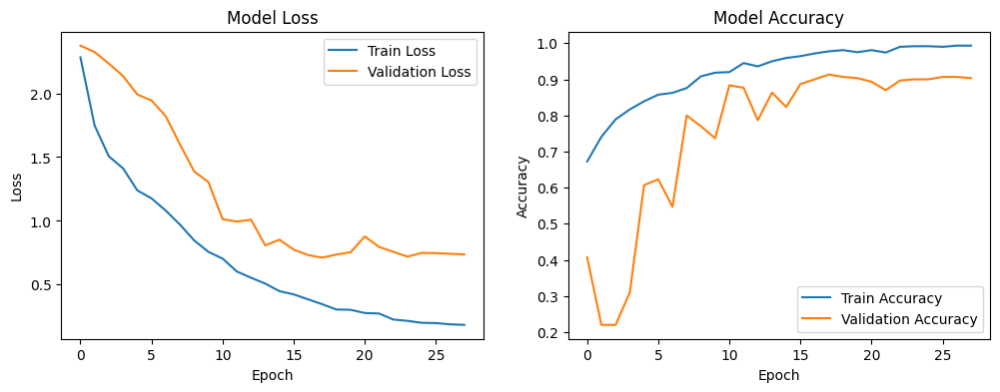

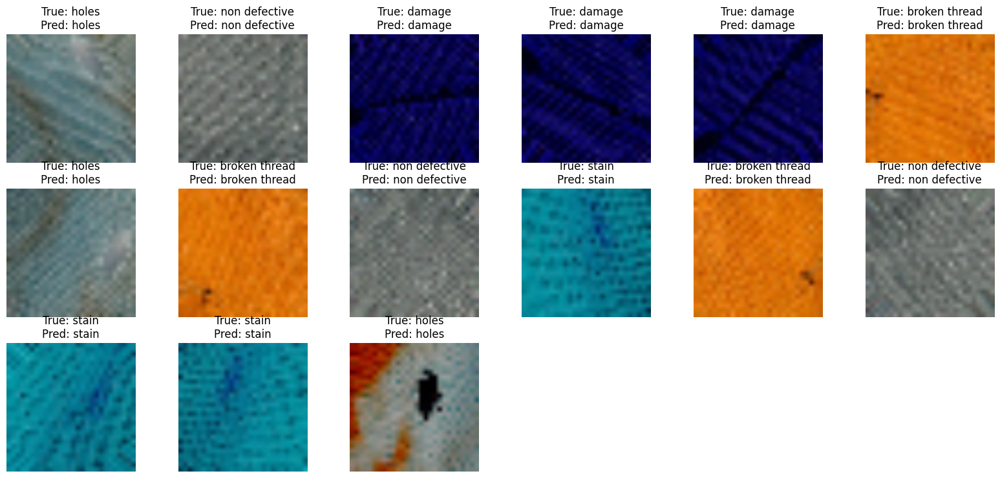

In [ ]:
#LSTM-CNN model
import os
import cv2
import numpy as np
import time
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout, Flatten, Conv1D, MaxPooling1D, BatchNormalization
from keras.utils import to_categorical
from keras.callbacks import ReduceLROnPlateau, EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score
import matplotlib.pyplot as plt

# Function to load the Kaggle image dataset in .jpg format
def load_dataset():
    base_dir = '/content/Train/Knitted/Dyed'
    categories = ['stain', 'damage', 'broken thread', 'holes', 'non defective']
    images = []
    labels = []
    category_counts = {category: 0 for category in categories}
    # To track the number of images per category

    for label, category in enumerate(categories):
        category_dir = os.path.join(base_dir, category)
        if not os.path.exists(category_dir):
            print(f"Directory {category_dir} does not exist. Skipping this category.")
            continue
        for filename in os.listdir(category_dir):
            if filename.endswith('.jpg'):
                img = cv2.imread(os.path.join(category_dir, filename))
                img = cv2.resize(img, (28, 28))  # Resize image to 28x28
                images.append(img)
                labels.append(label)
                category_counts[category] += 1  # Count the images for each category

    images = np.array(images)
    labels = np.array(labels)

    print("Image counts per category:", category_counts)  # Print the counts for debugging

    return images, labels, categories

# Load the Kaggle image dataset
images, labels, categories = load_dataset()

if len(images) == 0:
    raise ValueError("No images found. Please check the dataset path and ensure images are available.")

# Preprocess the images (normalize pixel values)
images = images.astype('float32') / 255.0

# Convert labels to one-hot encoding
labels = to_categorical(labels, num_classes=len(categories))

# Reshape images for LSTM input (assuming each image is treated as a sequence of pixels)
images = images.reshape(images.shape[0], -1, images.shape[3])  # Adjust to (batch_size, sequence_length, feature_dim)

# Split the dataset into training and test sets
trainX, testX, trainY, testY = train_test_split(images, labels, test_size=0.2, random_state=42)

# Verify shapes of trainX, testX, trainY, testY
print("Shape of trainX:", trainX.shape)
print("Shape of testX:", testX.shape)
print("Shape of trainY:", trainY.shape)
print("Shape of testY:", testY.shape)

# Define the single LSTM-CNN model
model = Sequential()
model.add(LSTM(128, input_shape=(trainX.shape[1], trainX.shape[2]), return_sequences=True))
model.add(Dropout(0.5))


# Ensure the input dimension is compatible with Conv1D
model.add(Conv1D(64, 3, activation='relu', padding='same', kernel_regularizer='l2'))
model.add(BatchNormalization())
model.add(MaxPooling1D(2))

# Flatten and add the output layer
model.add(Flatten())
model.add(Dense(len(categories), activation='softmax', kernel_regularizer='l2'))

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Print model summary
print(model.summary())

# Callbacks for learning rate reduction and early stopping
lr_reduction = ReduceLROnPlateau(monitor='val_loss', patience=3, verbose=1, factor=0.5, min_lr=0.000001)
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model
start_time = time.time()
history = model.fit(trainX, trainY, epochs=90, batch_size=32, validation_data=(testX, testY), callbacks=[lr_reduction, early_stopping], verbose=1)
end_time = time.time()

# Evaluate the model
loss, accuracy = model.evaluate(testX, testY, verbose=0)
print('Test Loss:', loss)
print('Test Accuracy:', accuracy)

# Get predictions for the test set
predY = model.predict(testX)
predY_classes = np.argmax(predY, axis=1)
trueY_classes = np.argmax(testY, axis=1)

# Ensure we only use labels present in the test set
unique_true_labels = np.unique(trueY_classes)

# Print classification report
class_report = classification_report(
    trueY_classes, predY_classes,
    target_names=[categories[i] for i in unique_true_labels],
    output_dict=True,
    zero_division=0
)
print(class_report)

# Print confusion matrix
conf_matrix = confusion_matrix(trueY_classes, predY_classes)
print(conf_matrix)

# Calculate and print additional metrics
accuracy_scores = accuracy_score(trueY_classes, predY_classes)
f1_scores = f1_score(trueY_classes, predY_classes, average=None)

print("Accuracy Scores: ", accuracy_scores)
print("F1 Scores: ", f1_scores)
print("Average F1 Score: ", np.mean(f1_scores))

# Calculate and display accuracy for each category
category_accuracies = {}
for i, category in enumerate(categories):
    category_mask = (trueY_classes == i)
    category_correct = (predY_classes[category_mask] == i).sum()
    category_total = category_mask.sum()
    category_accuracies[category] = category_correct / category_total
    print(f"Accuracy for {category}: {category_accuracies[category]:.2f}")

print(f"Total Training Time: {end_time - start_time} seconds")

# Plot training & validation loss and accuracy values
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper right')

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')

plt.show()

# Visualize test images with improved pixel quality and ensure class representation
plt.figure(figsize=(20, 15))

# Dictionary to track how many images have been displayed per class
displayed_count = {category: 0 for category in categories}

# Maximum number of images to display per class
max_images_per_class = 3

displayed_images = 0
for i in range(len(testX)):
    true_label = categories[trueY_classes[i]]
    if displayed_count[true_label] < max_images_per_class:
        plt.subplot(5, 6, displayed_images + 1)  # Adjusting the grid for 18 images
        resized_image = cv2.resize(testX[i].reshape(28, 28, 3), (128, 128))  # Rescale for better quality
        plt.imshow(resized_image)
        plt.title(f"True: {true_label}\nPred: {categories[predY_classes[i]]}")
        plt.axis('off')

        displayed_count[true_label] += 1
        displayed_images += 1

    # Break the loop after displaying 18 images (3 images per class, 6 classes)
    if displayed_images >= max_images_per_class * len(categories):
        break

plt.show()


In [ ]:
# Save the trained model in .h5 format for Raspberry Pi
model.save('/content/model_KNITTED_dyed.h5')
print("Model saved in .h5 format.")


Model saved in .h5 format.


In [ ]:
import os
import tensorflow as tf

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  # Suppress TensorFlow logging (1: info, 2: warning, 3: error)
tf.get_logger().setLevel('ERROR')  # Suppress additional warnings


In [ ]:
! pip install kaggle
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json
! kaggle datasets download -d sobouhiarif/test-new-fab-type

mkdir: cannot create directory ‘/root/.kaggle’: File exists
Dataset URL: https://www.kaggle.com/datasets/sobouhiarif/test-new-fab-type
License(s): unknown
test-new-fab-type.zip: Skipping, found more recently modified local copy (use --force to force download)


In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("sobouhiarif/test-new-fab-type")

print("Path to dataset files:", path)

100%|██████████| 1.01G/1.01G [00:47<00:00, 22.8MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/sobouhiarif/test-new-fab-type/versions/1


In [ ]:
! unzip /content/test-new-fab-type.zip

Archive:  /content/test-new-fab-type.zip
  inflating: Test/Knitted/Dyed/broken thread/WIN_20240720_13_04_26_Pro.jpg  
replace Test/Knitted/Dyed/broken thread/WIN_20240720_13_04_29_Pro.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: Test/Knitted/Dyed/broken thread/WIN_20240720_13_04_29_Pro.jpg  
  inflating: Test/Knitted/Dyed/broken thread/WIN_20240720_13_06_52_Pro.jpg  
replace Test/Knitted/Dyed/broken thread/WIN_20240720_13_06_57_Pro.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: Test/Knitted/Dyed/broken thread/WIN_20240720_13_06_57_Pro.jpg  
  inflating: Test/Knitted/Dyed/broken thread/WIN_20240720_13_07_02_Pro.jpg  
replace Test/Knitted/Dyed/broken thread/WIN_20240720_13_07_10_Pro.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: Test/Knitted/Dyed/broken thread/WIN_20240720_13_07_10_Pro.jpg  
  inflating: Test/Knitted/Dyed/broken thread/WIN_20240720_13_07_25_Pro.jpg  
  inflating: Test/Knitted/Dyed/broken thread/WIN_20240720_13_07_32_Pro.jpg  
  inflatin

Model loaded successfully.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━

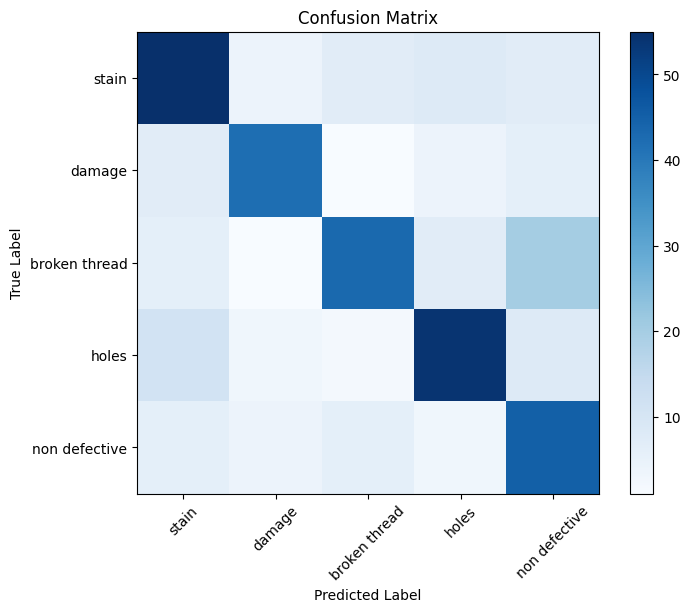

Loading image: /content/Test/Knitted/Dyed/stain/WIN_20241029_13_26_37_Pro.jpg
Loading image: /content/Test/Knitted/Dyed/stain/WIN_20240720_13_00_00_Pro.jpg
Loading image: /content/Test/Knitted/Dyed/stain/WIN_20240720_13_10_30_Pro.jpg
Loading image: /content/Test/Knitted/Dyed/damage/WIN_20240729_12_57_45_Pro.jpg
Loading image: /content/Test/Knitted/Dyed/damage/WIN_20241029_13_25_59_Pro.jpg
Loading image: /content/Test/Knitted/Dyed/damage/WIN_20241018_14_37_28_Pro.jpg
Loading image: /content/Test/Knitted/Dyed/broken thread/WIN_20240720_13_07_02_Pro.jpg
Loading image: /content/Test/Knitted/Dyed/broken thread/WIN_20241018_14_18_11_Pro.jpg
Loading image: /content/Test/Knitted/Dyed/broken thread/WIN_20240720_13_06_57_Pro.jpg
Loading image: /content/Test/Knitted/Dyed/holes/WIN_20241018_12_38_03_Pro.jpg
Loading image: /content/Test/Knitted/Dyed/holes/WIN_20241029_13_23_04_Pro.jpg
Loading image: /content/Test/Knitted/Dyed/holes/WIN_20241028_19_24_20_Pro.jpg
Loading image: /content/Test/Knitted/

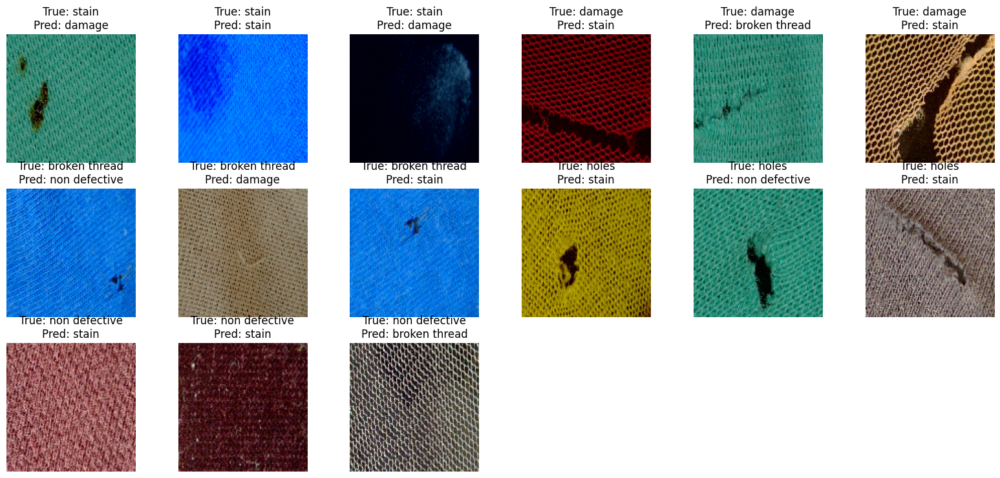

In [ ]:
import cv2
import numpy as np
from keras.models import load_model
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score
import matplotlib.pyplot as plt
import os

# Load the saved model
model_path = '/content/model_KNITTED_dyed.h5'
model = load_model(model_path)
print("Model loaded successfully.")

# Define categories and initialize lists to track true and predicted labels
categories = ['stain', 'damage', 'broken thread', 'holes', 'non defective']
true_labels = []
predicted_labels = []

# Function to preprocess and predict on a single image
def predict_defect(image_path):
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError(f"Image at path {image_path} could not be loaded.")
    img = cv2.resize(img, (28, 28))  # Resize to 28x28 pixels
    img = img.astype('float32') / 255.0  # Normalize

    # Reshape to match the model's expected input shape
    img = img.reshape(1, 784, 3)  # Flatten to (batch_size, sequence_length, features)

    # Predict the defect class
    prediction = model.predict(img)
    predicted_class = np.argmax(prediction, axis=1)[0]
    return predicted_class



# Load and predict on new test dataset
test_dir = '/content/Test/Knitted/Dyed'
for category_index, category in enumerate(categories):
    category_path = os.path.join(test_dir, category)
    if not os.path.exists(category_path):
        print(f"Directory {category_path} does not exist. Skipping.")
        continue

    for img_file in os.listdir(category_path):
        img_path = os.path.join(category_path, img_file)
        if img_file.endswith('.jpg'):
            pred_label = predict_defect(img_path)
            true_labels.append(category_index)
            predicted_labels.append(pred_label)

# Get unique classes from the true and predicted labels
unique_labels = np.unique(np.concatenate((true_labels, predicted_labels)))

# Classification Report and Metrics
print("\nClassification Report:")
class_report = classification_report(
    true_labels,
    predicted_labels,
    labels=unique_labels,  # Use the unique labels
    target_names=categories,
    output_dict=True,
    zero_division=0
)

print(class_report)


# Confusion Matrix
conf_matrix = confusion_matrix(true_labels, predicted_labels)
print("\nConfusion Matrix:\n", conf_matrix)

# Class-Specific Accuracy
category_accuracies = {}
for i, category in enumerate(categories):
    mask = (np.array(true_labels) == i)
    correct_predictions = (np.array(predicted_labels)[mask] == i).sum()
    category_accuracies[category] = correct_predictions / mask.sum() if mask.sum() > 0 else 0
    print(f"Accuracy for {category}: {category_accuracies[category]:.2f}")

# Calculate overall metrics
accuracy_scores = accuracy_score(true_labels, predicted_labels)
f1_scores = f1_score(true_labels, predicted_labels, average=None)
print("\nOverall Accuracy Score: ", accuracy_scores)
print("F1 Scores: ", f1_scores)
print("Average F1 Score: ", np.mean(f1_scores))

# Plot Confusion Matrix
plt.figure(figsize=(8, 6))
plt.imshow(conf_matrix, interpolation='nearest', cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.colorbar()
plt.xticks(np.arange(len(categories)), categories, rotation=45)
plt.yticks(np.arange(len(categories)), categories)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

# Display sample images with true and predicted labels (3 images per category)
plt.figure(figsize=(20, 15))
displayed_count = {category: 0 for category in categories}
max_images_per_class = 3
displayed_images = 0

# Loop over the categories to display images
for category_index, category in enumerate(categories):
    category_path = os.path.join(test_dir, category)
    if not os.path.exists(category_path):
        print(f"Directory {category_path} does not exist. Skipping.")
        continue

    for img_file in os.listdir(category_path):
        if displayed_count[category] < max_images_per_class and img_file.endswith('.jpg'):
            img_path = os.path.join(category_path, img_file)
            print(f"Loading image: {img_path}")  # Print the image path for debugging
            img = cv2.imread(img_path)

            # Check if the image was loaded successfully
            if img is not None:
                img = cv2.resize(img, (128, 128))  # Resize for better display quality
                plt.subplot(5, 6, displayed_images + 1)
                plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB
                plt.title(f"True: {category}\nPred: {categories[predicted_labels[displayed_images]]}")
                plt.axis('off')

                displayed_count[category] += 1
                displayed_images += 1

                # Stop after showing 3 images per category
                if displayed_images >= max_images_per_class * len(categories):
                    break
            else:
                print(f"Warning: Image at path '{img_path}' could not be loaded.")  # Print a warning if the image fails to load

plt.show()


Image counts per category: {'stain': 300, 'damage': 300, 'broken thread': 300, 'holes': 300, 'non defective': 300}
Shape of trainX: (1200, 784, 3)
Shape of testX: (300, 784, 3)
Shape of trainY: (1200, 5)
Shape of testY: (300, 5)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_2 (LSTM)                        │ (None, 784, 128)            │          67,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 784, 128)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_2 (Conv1D)                    │ (None, 784, 64)             │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 784, 64)             │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_2 (MaxPooling1D)       │ (None, 392, 64)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_2 (Flatten)                  │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 5)                   │         125,445 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 217,925 (851.27 KB)

 Trainable params: 217,797 (850.77 KB)

 Non-trainable params: 128 (512.00 B)

None
Epoch 1/90
38/38 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - accuracy: 0.3267 - loss: 3.3436 - val_accuracy: 0.2233 - val_loss: 2.4259 - learning_rate: 0.0010
Epoch 2/90
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - accuracy: 0.7455 - loss: 1.5816 - val_accuracy: 0.2333 - val_loss: 2.2660 - learning_rate: 0.0010
Epoch 3/90
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - accuracy: 0.9170 - loss: 1.1592 - val_accuracy: 0.2533 - val_loss: 2.0442 - learning_rate: 0.0010
Epoch 4/90
38/38 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - accuracy: 0.9268 - loss: 0.9916 - val_accuracy: 0.7533 - val_loss: 1.7976 - learning_rate: 0.0010
Epoch 5/90
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - accuracy: 0.9535 - loss: 0.8041 - val_accuracy: 0.7467 - val_loss: 1.6016 - learning_rate: 0.0010
Epoch 6/90
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - accuracy: 0.9729 - loss: 0.6393 - val_accuracy: 0.7800 - val_loss: 1.4777 - learning_rate: 0.0010
Epoch 7/90
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - accuracy: 0.9665 - loss: 0.5944 - va

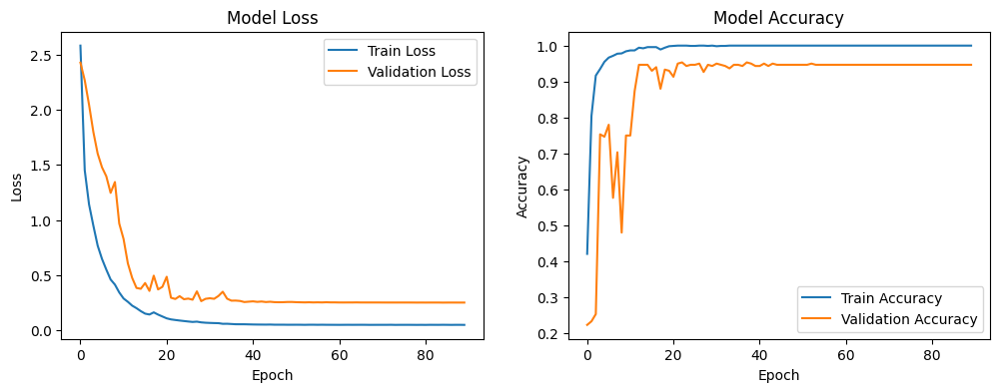

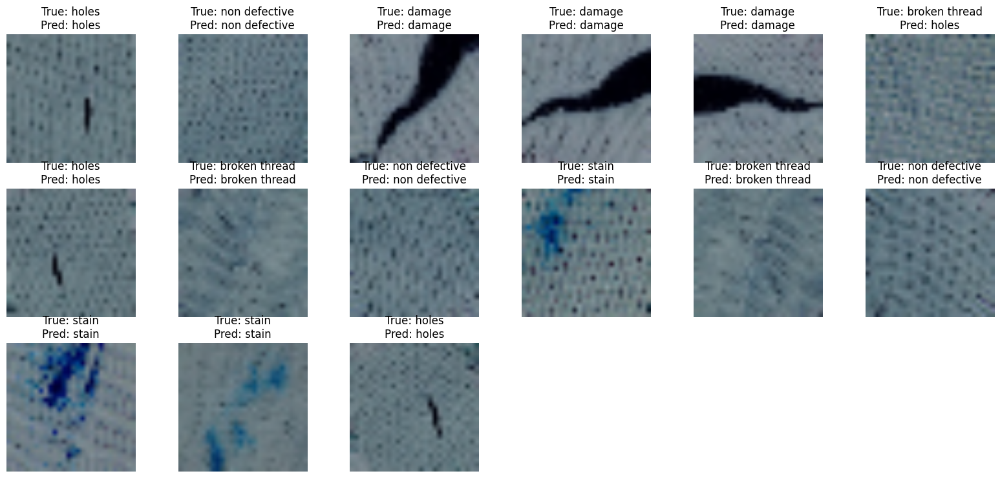

In [ ]:
#LSTM-CNN model
import os
import cv2
import numpy as np
import time
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout, Flatten, Conv1D, MaxPooling1D, BatchNormalization
from keras.utils import to_categorical
from keras.callbacks import ReduceLROnPlateau, EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score
import matplotlib.pyplot as plt

# Function to load the Kaggle image dataset in .jpg format
def load_dataset():
    base_dir = '/content/Train/Knitted/Gray'
    categories = ['stain', 'damage', 'broken thread', 'holes', 'non defective']
    images = []
    labels = []
    category_counts = {category: 0 for category in categories}
    # To track the number of images per category

    for label, category in enumerate(categories):
        category_dir = os.path.join(base_dir, category)
        if not os.path.exists(category_dir):
            print(f"Directory {category_dir} does not exist. Skipping this category.")
            continue
        for filename in os.listdir(category_dir):
            if filename.endswith('.jpg'):
                img = cv2.imread(os.path.join(category_dir, filename))
                img = cv2.resize(img, (28, 28))  # Resize image to 28x28
                images.append(img)
                labels.append(label)
                category_counts[category] += 1  # Count the images for each category

    images = np.array(images)
    labels = np.array(labels)

    print("Image counts per category:", category_counts)  # Print the counts for debugging

    return images, labels, categories

# Load the Kaggle image dataset
images, labels, categories = load_dataset()

if len(images) == 0:
    raise ValueError("No images found. Please check the dataset path and ensure images are available.")

# Preprocess the images (normalize pixel values)
images = images.astype('float32') / 255.0

# Convert labels to one-hot encoding
labels = to_categorical(labels, num_classes=len(categories))

# Reshape images for LSTM input (assuming each image is treated as a sequence of pixels)
images = images.reshape(images.shape[0], -1, images.shape[3])  # Adjust to (batch_size, sequence_length, feature_dim)

# Split the dataset into training and test sets
trainX, testX, trainY, testY = train_test_split(images, labels, test_size=0.2, random_state=42)

# Verify shapes of trainX, testX, trainY, testY
print("Shape of trainX:", trainX.shape)
print("Shape of testX:", testX.shape)
print("Shape of trainY:", trainY.shape)
print("Shape of testY:", testY.shape)

# Define the single LSTM-CNN model
model = Sequential()
model.add(LSTM(128, input_shape=(trainX.shape[1], trainX.shape[2]), return_sequences=True))
model.add(Dropout(0.5))


# Ensure the input dimension is compatible with Conv1D
model.add(Conv1D(64, 3, activation='relu', padding='same', kernel_regularizer='l2'))
model.add(BatchNormalization())
model.add(MaxPooling1D(2))

# Flatten and add the output layer
model.add(Flatten())
model.add(Dense(len(categories), activation='softmax', kernel_regularizer='l2'))

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Print model summary
print(model.summary())

# Callbacks for learning rate reduction and early stopping
lr_reduction = ReduceLROnPlateau(monitor='val_loss', patience=3, verbose=1, factor=0.5, min_lr=0.000001)
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model
start_time = time.time()
history = model.fit(trainX, trainY, epochs=90, batch_size=32, validation_data=(testX, testY), callbacks=[lr_reduction, early_stopping], verbose=1)
end_time = time.time()

# Evaluate the model
loss, accuracy = model.evaluate(testX, testY, verbose=0)
print('Test Loss:', loss)
print('Test Accuracy:', accuracy)

# Get predictions for the test set
predY = model.predict(testX)
predY_classes = np.argmax(predY, axis=1)
trueY_classes = np.argmax(testY, axis=1)

# Ensure we only use labels present in the test set
unique_true_labels = np.unique(trueY_classes)

# Print classification report
class_report = classification_report(
    trueY_classes, predY_classes,
    target_names=[categories[i] for i in unique_true_labels],
    output_dict=True,
    zero_division=0
)
print(class_report)

# Print confusion matrix
conf_matrix = confusion_matrix(trueY_classes, predY_classes)
print(conf_matrix)

# Calculate and print additional metrics
accuracy_scores = accuracy_score(trueY_classes, predY_classes)
f1_scores = f1_score(trueY_classes, predY_classes, average=None)

print("Accuracy Scores: ", accuracy_scores)
print("F1 Scores: ", f1_scores)
print("Average F1 Score: ", np.mean(f1_scores))

# Calculate and display accuracy for each category
category_accuracies = {}
for i, category in enumerate(categories):
    category_mask = (trueY_classes == i)
    category_correct = (predY_classes[category_mask] == i).sum()
    category_total = category_mask.sum()
    category_accuracies[category] = category_correct / category_total
    print(f"Accuracy for {category}: {category_accuracies[category]:.2f}")

print(f"Total Training Time: {end_time - start_time} seconds")

# Plot training & validation loss and accuracy values
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper right')

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')

plt.show()

# Visualize test images with improved pixel quality and ensure class representation
plt.figure(figsize=(20, 15))

# Dictionary to track how many images have been displayed per class
displayed_count = {category: 0 for category in categories}

# Maximum number of images to display per class
max_images_per_class = 3

displayed_images = 0
for i in range(len(testX)):
    true_label = categories[trueY_classes[i]]
    if displayed_count[true_label] < max_images_per_class:
        plt.subplot(5, 6, displayed_images + 1)  # Adjusting the grid for 18 images
        resized_image = cv2.resize(testX[i].reshape(28, 28, 3), (128, 128))  # Rescale for better quality
        plt.imshow(resized_image)
        plt.title(f"True: {true_label}\nPred: {categories[predY_classes[i]]}")
        plt.axis('off')

        displayed_count[true_label] += 1
        displayed_images += 1

    # Break the loop after displaying 18 images (3 images per class, 6 classes)
    if displayed_images >= max_images_per_class * len(categories):
        break

plt.show()


In [ ]:
# Save the trained model in .h5 format for Raspberry Pi
model.save('/content/model_knitted_Gray.h5')
print("Model saved in .h5 format.")


Model saved in .h5 format.


Model loaded successfully.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━

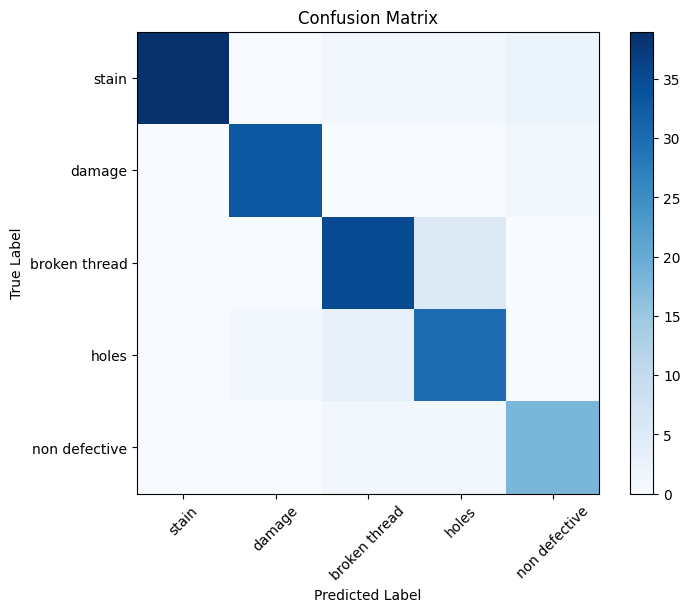

Loading image: /content/Test/Knitted/Gray/stain/WIN_20241029_17_21_26_Pro.jpg
Loading image: /content/Test/Knitted/Gray/stain/WIN_20241028_21_30_32_Pro.jpg
Loading image: /content/Test/Knitted/Gray/stain/WIN_20241028_19_34_55_Pro.jpg
Loading image: /content/Test/Knitted/Gray/damage/WIN_20241028_21_26_55_Pro.jpg
Loading image: /content/Test/Knitted/Gray/damage/WIN_20241028_21_38_06_Pro.jpg
Loading image: /content/Test/Knitted/Gray/damage/WIN_20241028_21_27_04_Pro.jpg
Loading image: /content/Test/Knitted/Gray/broken thread/WIN_20241028_20_10_43_Pro.jpg
Loading image: /content/Test/Knitted/Gray/broken thread/WIN_20241029_16_23_05_Pro.jpg
Loading image: /content/Test/Knitted/Gray/broken thread/WIN_20241028_19_14_16_Pro.jpg
Loading image: /content/Test/Knitted/Gray/holes/WIN_20241029_16_22_03_Pro.jpg
Loading image: /content/Test/Knitted/Gray/holes/WIN_20241028_19_27_35_Pro.jpg
Loading image: /content/Test/Knitted/Gray/holes/WIN_20241028_19_28_25_Pro.jpg
Loading image: /content/Test/Knitted/

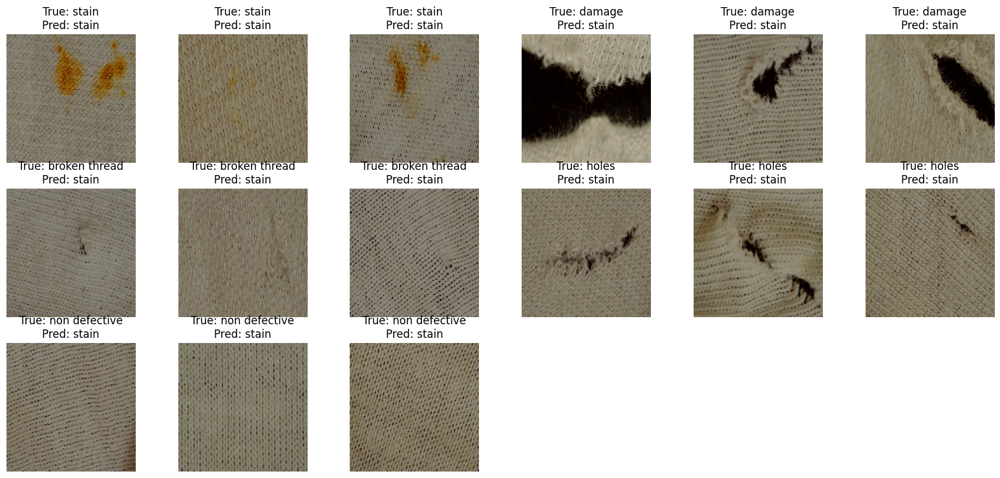

In [ ]:
import cv2
import numpy as np
from keras.models import load_model
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score
import matplotlib.pyplot as plt
import os

# Load the saved model
model_path = '/content/model_knitted_Gray.h5'
model = load_model(model_path)
print("Model loaded successfully.")

# Define categories and initialize lists to track true and predicted labels
categories = ['stain', 'damage', 'broken thread', 'holes', 'non defective']
true_labels = []
predicted_labels = []

# Function to preprocess and predict on a single image
def predict_defect(image_path):
    img = cv2.imread(image_path)
    img = cv2.resize(img, (28, 28))  # Resize to 28x28 pixels
    img = img.astype('float32') / 255.0  # Normalize
    img = img.reshape(1, -1, img.shape[2])  # Reshape for LSTM input

    # Predict the defect class
    prediction = model.predict(img)
    predicted_class = np.argmax(prediction, axis=1)[0]
    return predicted_class

# Load and predict on new test dataset
test_dir = '/content/Test/Knitted/Gray'
for category_index, category in enumerate(categories):
    category_path = os.path.join(test_dir, category)
    if not os.path.exists(category_path):
        print(f"Directory {category_path} does not exist. Skipping.")
        continue

    for img_file in os.listdir(category_path):
        img_path = os.path.join(category_path, img_file)
        if img_file.endswith('.jpg'):
            pred_label = predict_defect(img_path)
            true_labels.append(category_index)
            predicted_labels.append(pred_label)

# Get unique classes from the true and predicted labels
unique_labels = np.unique(np.concatenate((true_labels, predicted_labels)))

# Classification Report and Metrics
print("\nClassification Report:")
class_report = classification_report(
    true_labels,
    predicted_labels,
    labels=unique_labels,  # Use the unique labels
    target_names=categories,
    output_dict=True,
    zero_division=0
)

print(class_report)


# Confusion Matrix
conf_matrix = confusion_matrix(true_labels, predicted_labels)
print("\nConfusion Matrix:\n", conf_matrix)

# Class-Specific Accuracy
category_accuracies = {}
for i, category in enumerate(categories):
    mask = (np.array(true_labels) == i)
    correct_predictions = (np.array(predicted_labels)[mask] == i).sum()
    category_accuracies[category] = correct_predictions / mask.sum() if mask.sum() > 0 else 0
    print(f"Accuracy for {category}: {category_accuracies[category]:.2f}")

# Calculate overall metrics
accuracy_scores = accuracy_score(true_labels, predicted_labels)
f1_scores = f1_score(true_labels, predicted_labels, average=None)
print("\nOverall Accuracy Score: ", accuracy_scores)
print("F1 Scores: ", f1_scores)
print("Average F1 Score: ", np.mean(f1_scores))

# Plot Confusion Matrix
plt.figure(figsize=(8, 6))
plt.imshow(conf_matrix, interpolation='nearest', cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.colorbar()
plt.xticks(np.arange(len(categories)), categories, rotation=45)
plt.yticks(np.arange(len(categories)), categories)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

# Display sample images with true and predicted labels (3 images per category)
plt.figure(figsize=(20, 15))
displayed_count = {category: 0 for category in categories}
max_images_per_class = 3
displayed_images = 0

# Loop over the categories to display images
for category_index, category in enumerate(categories):
    category_path = os.path.join(test_dir, category)
    if not os.path.exists(category_path):
        print(f"Directory {category_path} does not exist. Skipping.")
        continue

    for img_file in os.listdir(category_path):
        if displayed_count[category] < max_images_per_class and img_file.endswith('.jpg'):
            img_path = os.path.join(category_path, img_file)
            print(f"Loading image: {img_path}")  # Print the image path for debugging
            img = cv2.imread(img_path)

            # Check if the image was loaded successfully
            if img is not None:
                img = cv2.resize(img, (128, 128))  # Resize for better display quality
                plt.subplot(5, 6, displayed_images + 1)
                plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB
                plt.title(f"True: {category}\nPred: {categories[predicted_labels[displayed_images]]}")
                plt.axis('off')

                displayed_count[category] += 1
                displayed_images += 1

                # Stop after showing 3 images per category
                if displayed_images >= max_images_per_class * len(categories):
                    break
            else:
                print(f"Warning: Image at path '{img_path}' could not be loaded.")  # Print a warning if the image fails to load

plt.show()


Image counts per category: {'stain': 300, 'damage': 300, 'broken thread': 300, 'holes': 300, 'non defective': 300}
Shape of trainX: (1200, 784, 3)
Shape of testX: (300, 784, 3)
Shape of trainY: (1200, 5)
Shape of testY: (300, 5)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_3 (LSTM)                        │ (None, 784, 128)            │          67,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 784, 128)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_3 (Conv1D)                    │ (None, 784, 64)             │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 784, 64)             │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_3 (MaxPooling1D)       │ (None, 392, 64)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_3 (Flatten)                  │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 5)                   │         125,445 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 217,925 (851.27 KB)

 Trainable params: 217,797 (850.77 KB)

 Non-trainable params: 128 (512.00 B)

None
Epoch 1/90
38/38 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step - accuracy: 0.5432 - loss: 2.5217 - val_accuracy: 0.6000 - val_loss: 2.3936 - learning_rate: 0.0010
Epoch 2/90
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.9049 - loss: 1.2945 - val_accuracy: 0.6667 - val_loss: 2.2890 - learning_rate: 0.0010
Epoch 3/90
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - accuracy: 0.9144 - loss: 1.1058 - val_accuracy: 0.7133 - val_loss: 2.1216 - learning_rate: 0.0010
Epoch 4/90
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - accuracy: 0.9319 - loss: 0.8941 - val_accuracy: 0.5000 - val_loss: 2.0166 - learning_rate: 0.0010
Epoch 5/90
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - accuracy: 0.9504 - loss: 0.7681 - val_accuracy: 0.8733 - val_loss: 1.7925 - learning_rate: 0.0010
Epoch 6/90
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - accuracy: 0.9513 - loss: 0.6567 - val_accuracy: 0.8667 - val_loss: 1.6440 - learning_rate: 0.0010
Epoch 7/90
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - accuracy: 0.9616 - loss: 0.5624 - va

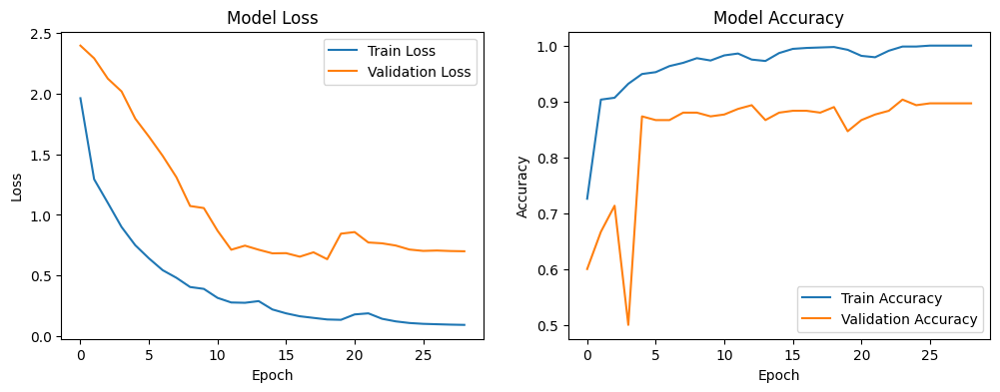

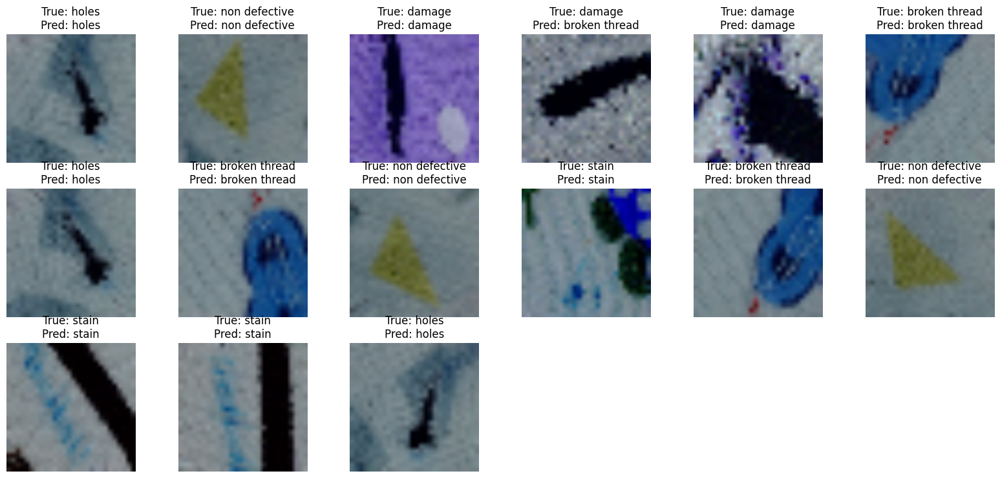

In [ ]:
#LSTM-CNN model
import os
import cv2
import numpy as np
import time
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout, Flatten, Conv1D, MaxPooling1D, BatchNormalization
from keras.utils import to_categorical
from keras.callbacks import ReduceLROnPlateau, EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score
import matplotlib.pyplot as plt

# Function to load the Kaggle image dataset in .jpg format
def load_dataset():
    base_dir = '/content/Train/Knitted/Printed'
    categories = ['stain', 'damage', 'broken thread', 'holes', 'non defective']
    images = []
    labels = []
    category_counts = {category: 0 for category in categories}
    # To track the number of images per category

    for label, category in enumerate(categories):
        category_dir = os.path.join(base_dir, category)
        if not os.path.exists(category_dir):
            print(f"Directory {category_dir} does not exist. Skipping this category.")
            continue
        for filename in os.listdir(category_dir):
            if filename.endswith('.jpg'):
                img = cv2.imread(os.path.join(category_dir, filename))
                img = cv2.resize(img, (28, 28))  # Resize image to 28x28
                images.append(img)
                labels.append(label)
                category_counts[category] += 1  # Count the images for each category

    images = np.array(images)
    labels = np.array(labels)

    print("Image counts per category:", category_counts)  # Print the counts for debugging

    return images, labels, categories

# Load the Kaggle image dataset
images, labels, categories = load_dataset()

if len(images) == 0:
    raise ValueError("No images found. Please check the dataset path and ensure images are available.")

# Preprocess the images (normalize pixel values)
images = images.astype('float32') / 255.0

# Convert labels to one-hot encoding
labels = to_categorical(labels, num_classes=len(categories))

# Reshape images for LSTM input (assuming each image is treated as a sequence of pixels)
images = images.reshape(images.shape[0], -1, images.shape[3])  # Adjust to (batch_size, sequence_length, feature_dim)

# Split the dataset into training and test sets
trainX, testX, trainY, testY = train_test_split(images, labels, test_size=0.2, random_state=42)

# Verify shapes of trainX, testX, trainY, testY
print("Shape of trainX:", trainX.shape)
print("Shape of testX:", testX.shape)
print("Shape of trainY:", trainY.shape)
print("Shape of testY:", testY.shape)

# Define the single LSTM-CNN model
model = Sequential()
model.add(LSTM(128, input_shape=(trainX.shape[1], trainX.shape[2]), return_sequences=True))
model.add(Dropout(0.5))


# Ensure the input dimension is compatible with Conv1D
model.add(Conv1D(64, 3, activation='relu', padding='same', kernel_regularizer='l2'))
model.add(BatchNormalization())
model.add(MaxPooling1D(2))

# Flatten and add the output layer
model.add(Flatten())
model.add(Dense(len(categories), activation='softmax', kernel_regularizer='l2'))

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Print model summary
print(model.summary())

# Callbacks for learning rate reduction and early stopping
lr_reduction = ReduceLROnPlateau(monitor='val_loss', patience=3, verbose=1, factor=0.5, min_lr=0.000001)
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model
start_time = time.time()
history = model.fit(trainX, trainY, epochs=90, batch_size=32, validation_data=(testX, testY), callbacks=[lr_reduction, early_stopping], verbose=1)
end_time = time.time()

# Evaluate the model
loss, accuracy = model.evaluate(testX, testY, verbose=0)
print('Test Loss:', loss)
print('Test Accuracy:', accuracy)

# Get predictions for the test set
predY = model.predict(testX)
predY_classes = np.argmax(predY, axis=1)
trueY_classes = np.argmax(testY, axis=1)

# Ensure we only use labels present in the test set
unique_true_labels = np.unique(trueY_classes)

# Print classification report
class_report = classification_report(
    trueY_classes, predY_classes,
    target_names=[categories[i] for i in unique_true_labels],
    output_dict=True,
    zero_division=0
)
print(class_report)

# Print confusion matrix
conf_matrix = confusion_matrix(trueY_classes, predY_classes)
print(conf_matrix)

# Calculate and print additional metrics
accuracy_scores = accuracy_score(trueY_classes, predY_classes)
f1_scores = f1_score(trueY_classes, predY_classes, average=None)

print("Accuracy Scores: ", accuracy_scores)
print("F1 Scores: ", f1_scores)
print("Average F1 Score: ", np.mean(f1_scores))

# Calculate and display accuracy for each category
category_accuracies = {}
for i, category in enumerate(categories):
    category_mask = (trueY_classes == i)
    category_correct = (predY_classes[category_mask] == i).sum()
    category_total = category_mask.sum()
    category_accuracies[category] = category_correct / category_total
    print(f"Accuracy for {category}: {category_accuracies[category]:.2f}")

print(f"Total Training Time: {end_time - start_time} seconds")

# Plot training & validation loss and accuracy values
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper right')

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')

plt.show()

# Visualize test images with improved pixel quality and ensure class representation
plt.figure(figsize=(20, 15))

# Dictionary to track how many images have been displayed per class
displayed_count = {category: 0 for category in categories}

# Maximum number of images to display per class
max_images_per_class = 3

displayed_images = 0
for i in range(len(testX)):
    true_label = categories[trueY_classes[i]]
    if displayed_count[true_label] < max_images_per_class:
        plt.subplot(5, 6, displayed_images + 1)  # Adjusting the grid for 18 images
        resized_image = cv2.resize(testX[i].reshape(28, 28, 3), (128, 128))  # Rescale for better quality
        plt.imshow(resized_image)
        plt.title(f"True: {true_label}\nPred: {categories[predY_classes[i]]}")
        plt.axis('off')

        displayed_count[true_label] += 1
        displayed_images += 1

    # Break the loop after displaying 18 images (3 images per class, 6 classes)
    if displayed_images >= max_images_per_class * len(categories):
        break

plt.show()


In [ ]:
# Save the trained model in .h5 format for Raspberry Pi
model.save('/content/model_knitted_printed.h5')
print("Model saved in .h5 format.")


Model saved in .h5 format.


Model loaded successfully.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━

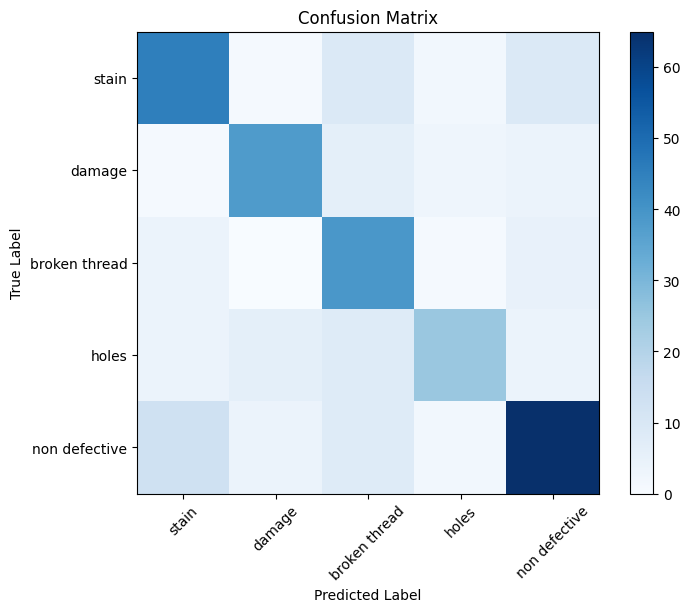

Loading image: /content/Test/Knitted/Printed/stain/WIN_20241029_15_25_55_Pro.jpg
Loading image: /content/Test/Knitted/Printed/stain/WIN_20241018_11_37_34_Pro.jpg
Loading image: /content/Test/Knitted/Printed/stain/WIN_20241018_12_53_07_Pro.jpg
Loading image: /content/Test/Knitted/Printed/damage/WIN_20241029_17_18_30_Pro.jpg
Loading image: /content/Test/Knitted/Printed/damage/WIN_20241028_21_23_19_Pro.jpg
Loading image: /content/Test/Knitted/Printed/damage/WIN_20241018_12_23_46_Pro.jpg
Loading image: /content/Test/Knitted/Printed/broken thread/WIN_20241029_16_16_30_Pro.jpg
Loading image: /content/Test/Knitted/Printed/broken thread/WIN_20241029_15_24_39_Pro.jpg
Loading image: /content/Test/Knitted/Printed/broken thread/WIN_20241029_15_24_35_Pro.jpg
Loading image: /content/Test/Knitted/Printed/holes/WIN_20241028_21_18_42_Pro.jpg
Loading image: /content/Test/Knitted/Printed/holes/WIN_20241028_20_23_01_Pro.jpg
Loading image: /content/Test/Knitted/Printed/holes/WIN_20241018_12_51_44_Pro.jpg
L

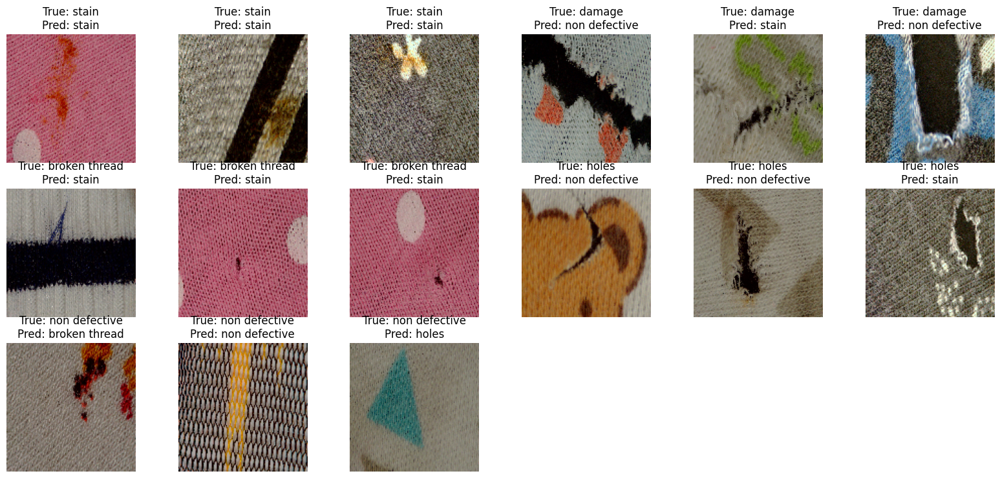

In [ ]:
import cv2
import numpy as np
from keras.models import load_model
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score
import matplotlib.pyplot as plt
import os

# Load the saved model
model_path = '/content/model_knitted_printed.h5'
model = load_model(model_path)
print("Model loaded successfully.")

# Define categories and initialize lists to track true and predicted labels
categories = ['stain', 'damage', 'broken thread', 'holes', 'non defective']
true_labels = []
predicted_labels = []

# Function to preprocess and predict on a single image
def predict_defect(image_path):
    img = cv2.imread(image_path)
    img = cv2.resize(img, (28, 28))  # Resize to 28x28 pixels
    img = img.astype('float32') / 255.0  # Normalize
    img = img.reshape(1, -1, img.shape[2])  # Reshape for LSTM input

    # Predict the defect class
    prediction = model.predict(img)
    predicted_class = np.argmax(prediction, axis=1)[0]
    return predicted_class

# Load and predict on new test dataset
test_dir = '/content/Test/Knitted/Printed'
for category_index, category in enumerate(categories):
    category_path = os.path.join(test_dir, category)
    if not os.path.exists(category_path):
        print(f"Directory {category_path} does not exist. Skipping.")
        continue

    for img_file in os.listdir(category_path):
        img_path = os.path.join(category_path, img_file)
        if img_file.endswith('.jpg'):
            pred_label = predict_defect(img_path)
            true_labels.append(category_index)
            predicted_labels.append(pred_label)

# Get unique classes from the true and predicted labels
unique_labels = np.unique(np.concatenate((true_labels, predicted_labels)))

# Classification Report and Metrics
print("\nClassification Report:")
class_report = classification_report(
    true_labels,
    predicted_labels,
    labels=unique_labels,  # Use the unique labels
    target_names=categories,
    output_dict=True,
    zero_division=0
)

print(class_report)


# Confusion Matrix
conf_matrix = confusion_matrix(true_labels, predicted_labels)
print("\nConfusion Matrix:\n", conf_matrix)

# Class-Specific Accuracy
category_accuracies = {}
for i, category in enumerate(categories):
    mask = (np.array(true_labels) == i)
    correct_predictions = (np.array(predicted_labels)[mask] == i).sum()
    category_accuracies[category] = correct_predictions / mask.sum() if mask.sum() > 0 else 0
    print(f"Accuracy for {category}: {category_accuracies[category]:.2f}")

# Calculate overall metrics
accuracy_scores = accuracy_score(true_labels, predicted_labels)
f1_scores = f1_score(true_labels, predicted_labels, average=None)
print("\nOverall Accuracy Score: ", accuracy_scores)
print("F1 Scores: ", f1_scores)
print("Average F1 Score: ", np.mean(f1_scores))

# Plot Confusion Matrix
plt.figure(figsize=(8, 6))
plt.imshow(conf_matrix, interpolation='nearest', cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.colorbar()
plt.xticks(np.arange(len(categories)), categories, rotation=45)
plt.yticks(np.arange(len(categories)), categories)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

# Display sample images with true and predicted labels (3 images per category)
plt.figure(figsize=(20, 15))
displayed_count = {category: 0 for category in categories}
max_images_per_class = 3
displayed_images = 0

# Loop over the categories to display images
for category_index, category in enumerate(categories):
    category_path = os.path.join(test_dir, category)
    if not os.path.exists(category_path):
        print(f"Directory {category_path} does not exist. Skipping.")
        continue

    for img_file in os.listdir(category_path):
        if displayed_count[category] < max_images_per_class and img_file.endswith('.jpg'):
            img_path = os.path.join(category_path, img_file)
            print(f"Loading image: {img_path}")  # Print the image path for debugging
            img = cv2.imread(img_path)

            # Check if the image was loaded successfully
            if img is not None:
                img = cv2.resize(img, (128, 128))  # Resize for better display quality
                plt.subplot(5, 6, displayed_images + 1)
                plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB
                plt.title(f"True: {category}\nPred: {categories[predicted_labels[displayed_images]]}")
                plt.axis('off')

                displayed_count[category] += 1
                displayed_images += 1

                # Stop after showing 3 images per category
                if displayed_images >= max_images_per_class * len(categories):
                    break
            else:
                print(f"Warning: Image at path '{img_path}' could not be loaded.")  # Print a warning if the image fails to load

plt.show()


Image counts per category: {'stain': 300, 'damage': 300, 'broken thread': 300, 'holes': 300, 'non defective': 300}
Shape of trainX: (1200, 784, 3)
Shape of testX: (300, 784, 3)
Shape of trainY: (1200, 5)
Shape of testY: (300, 5)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_5 (LSTM)                        │ (None, 784, 128)            │          67,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 784, 128)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_5 (Conv1D)                    │ (None, 784, 64)             │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 784, 64)             │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_5 (MaxPooling1D)       │ (None, 392, 64)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_5 (Flatten)                  │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 5)                   │         125,445 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 217,925 (851.27 KB)

 Trainable params: 217,797 (850.77 KB)

 Non-trainable params: 128 (512.00 B)

None
Epoch 1/90
38/38 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.6434 - loss: 2.5251 - val_accuracy: 0.2200 - val_loss: 2.4782 - learning_rate: 0.0010
Epoch 2/90
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - accuracy: 0.8156 - loss: 1.6912 - val_accuracy: 0.4800 - val_loss: 2.2239 - learning_rate: 0.0010
Epoch 3/90
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - accuracy: 0.7762 - loss: 1.8283 - val_accuracy: 0.5633 - val_loss: 2.2348 - learning_rate: 0.0010
Epoch 4/90
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - accuracy: 0.8539 - loss: 1.3370 - val_accuracy: 0.8300 - val_loss: 1.9904 - learning_rate: 0.0010
Epoch 5/90
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - accuracy: 0.8496 - loss: 1.2500 - val_accuracy: 0.7667 - val_loss: 1.9351 - learning_rate: 0.0010
Epoch 6/90
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - accuracy: 0.8827 - loss: 1.1413 - val_accuracy: 0.6200 - val_loss: 1.8581 - learning_rate: 0.0010
Epoch 7/90
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - accuracy: 0.8891 - loss: 0.9973 - va

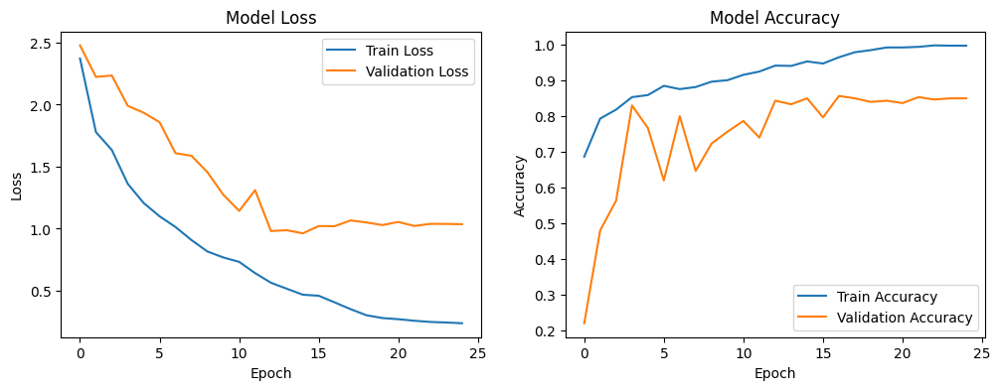

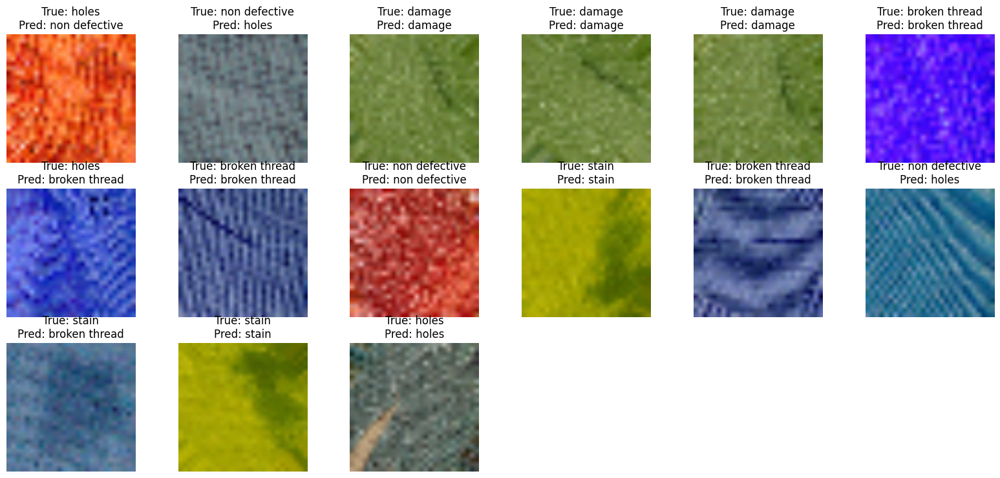

In [ ]:
#LSTM-CNN model
import os
import cv2
import numpy as np
import time
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout, Flatten, Conv1D, MaxPooling1D, BatchNormalization
from keras.utils import to_categorical
from keras.callbacks import ReduceLROnPlateau, EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score
import matplotlib.pyplot as plt

# Function to load the Kaggle image dataset in .jpg format
def load_dataset():
    base_dir = '/content/Train/Woven/Dyed'
    categories = ['stain', 'damage', 'broken thread', 'holes', 'non defective']
    images = []
    labels = []
    category_counts = {category: 0 for category in categories}
    # To track the number of images per category

    for label, category in enumerate(categories):
        category_dir = os.path.join(base_dir, category)
        if not os.path.exists(category_dir):
            print(f"Directory {category_dir} does not exist. Skipping this category.")
            continue
        for filename in os.listdir(category_dir):
            if filename.endswith('.jpg'):
                img = cv2.imread(os.path.join(category_dir, filename))
                img = cv2.resize(img, (28, 28))  # Resize image to 28x28
                images.append(img)
                labels.append(label)
                category_counts[category] += 1  # Count the images for each category

    images = np.array(images)
    labels = np.array(labels)

    print("Image counts per category:", category_counts)  # Print the counts for debugging

    return images, labels, categories

# Load the Kaggle image dataset
images, labels, categories = load_dataset()

if len(images) == 0:
    raise ValueError("No images found. Please check the dataset path and ensure images are available.")

# Preprocess the images (normalize pixel values)
images = images.astype('float32') / 255.0

# Convert labels to one-hot encoding
labels = to_categorical(labels, num_classes=len(categories))

# Reshape images for LSTM input (assuming each image is treated as a sequence of pixels)
images = images.reshape(images.shape[0], -1, images.shape[3])  # Adjust to (batch_size, sequence_length, feature_dim)

# Split the dataset into training and test sets
trainX, testX, trainY, testY = train_test_split(images, labels, test_size=0.2, random_state=42)

# Verify shapes of trainX, testX, trainY, testY
print("Shape of trainX:", trainX.shape)
print("Shape of testX:", testX.shape)
print("Shape of trainY:", trainY.shape)
print("Shape of testY:", testY.shape)

# Define the single LSTM-CNN model
model = Sequential()
model.add(LSTM(128, input_shape=(trainX.shape[1], trainX.shape[2]), return_sequences=True))
model.add(Dropout(0.5))


# Ensure the input dimension is compatible with Conv1D
model.add(Conv1D(64, 3, activation='relu', padding='same', kernel_regularizer='l2'))
model.add(BatchNormalization())
model.add(MaxPooling1D(2))

# Flatten and add the output layer
model.add(Flatten())
model.add(Dense(len(categories), activation='softmax', kernel_regularizer='l2'))

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Print model summary
print(model.summary())

# Callbacks for learning rate reduction and early stopping
lr_reduction = ReduceLROnPlateau(monitor='val_loss', patience=3, verbose=1, factor=0.5, min_lr=0.000001)
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model
start_time = time.time()
history = model.fit(trainX, trainY, epochs=90, batch_size=32, validation_data=(testX, testY), callbacks=[lr_reduction, early_stopping], verbose=1)
end_time = time.time()

# Evaluate the model
loss, accuracy = model.evaluate(testX, testY, verbose=0)
print('Test Loss:', loss)
print('Test Accuracy:', accuracy)

# Get predictions for the test set
predY = model.predict(testX)
predY_classes = np.argmax(predY, axis=1)
trueY_classes = np.argmax(testY, axis=1)

# Ensure we only use labels present in the test set
unique_true_labels = np.unique(trueY_classes)

# Print classification report
class_report = classification_report(
    trueY_classes, predY_classes,
    target_names=[categories[i] for i in unique_true_labels],
    output_dict=True,
    zero_division=0
)
print(class_report)

# Print confusion matrix
conf_matrix = confusion_matrix(trueY_classes, predY_classes)
print(conf_matrix)

# Calculate and print additional metrics
accuracy_scores = accuracy_score(trueY_classes, predY_classes)
f1_scores = f1_score(trueY_classes, predY_classes, average=None)

print("Accuracy Scores: ", accuracy_scores)
print("F1 Scores: ", f1_scores)
print("Average F1 Score: ", np.mean(f1_scores))

# Calculate and display accuracy for each category
category_accuracies = {}
for i, category in enumerate(categories):
    category_mask = (trueY_classes == i)
    category_correct = (predY_classes[category_mask] == i).sum()
    category_total = category_mask.sum()
    category_accuracies[category] = category_correct / category_total
    print(f"Accuracy for {category}: {category_accuracies[category]:.2f}")

print(f"Total Training Time: {end_time - start_time} seconds")

# Plot training & validation loss and accuracy values
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper right')

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')

plt.show()

# Visualize test images with improved pixel quality and ensure class representation
plt.figure(figsize=(20, 15))

# Dictionary to track how many images have been displayed per class
displayed_count = {category: 0 for category in categories}

# Maximum number of images to display per class
max_images_per_class = 3

displayed_images = 0
for i in range(len(testX)):
    true_label = categories[trueY_classes[i]]
    if displayed_count[true_label] < max_images_per_class:
        plt.subplot(5, 6, displayed_images + 1)  # Adjusting the grid for 18 images
        resized_image = cv2.resize(testX[i].reshape(28, 28, 3), (128, 128))  # Rescale for better quality
        plt.imshow(resized_image)
        plt.title(f"True: {true_label}\nPred: {categories[predY_classes[i]]}")
        plt.axis('off')

        displayed_count[true_label] += 1
        displayed_images += 1

    # Break the loop after displaying 18 images (3 images per class, 6 classes)
    if displayed_images >= max_images_per_class * len(categories):
        break

plt.show()


In [ ]:
# Save the trained model in .h5 format for Raspberry Pi
model.save('/content/model_woven_Dyed.h5')
print("Model saved in .h5 format.")


Model saved in .h5 format.


Model loaded successfully.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━

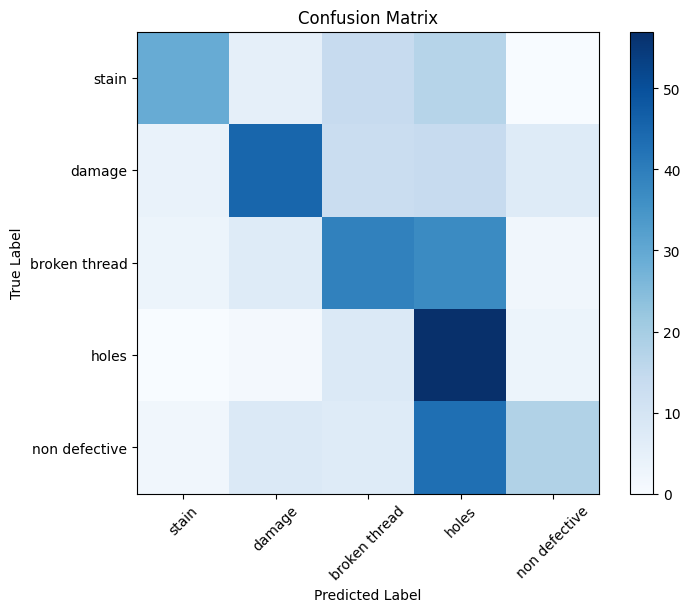

Loading image: /content/Test/Woven/Dyed/stain/WIN_20241018_12_04_06_Pro.jpg
Loading image: /content/Test/Woven/Dyed/stain/WIN_20240802_21_02_21_Pro.jpg
Loading image: /content/Test/Woven/Dyed/stain/WIN_20241018_12_04_17_Pro.jpg
Loading image: /content/Test/Woven/Dyed/damage/WIN_20240802_21_16_49_Pro.jpg
Loading image: /content/Test/Woven/Dyed/damage/WIN_20240801_19_16_13_Pro.jpg
Loading image: /content/Test/Woven/Dyed/damage/WIN_20241018_12_02_19_Pro.jpg
Loading image: /content/Test/Woven/Dyed/broken thread/WIN_20240729_12_30_15_Pro.jpg
Loading image: /content/Test/Woven/Dyed/broken thread/WIN_20240802_21_01_41_Pro.jpg
Loading image: /content/Test/Woven/Dyed/broken thread/WIN_20240729_12_25_27_Pro.jpg
Loading image: /content/Test/Woven/Dyed/holes/WIN_20241018_11_21_59_Pro.jpg
Loading image: /content/Test/Woven/Dyed/holes/WIN_20240729_12_25_39_Pro.jpg
Loading image: /content/Test/Woven/Dyed/holes/WIN_20240729_12_42_41_Pro.jpg
Loading image: /content/Test/Woven/Dyed/non defective/WIN_202

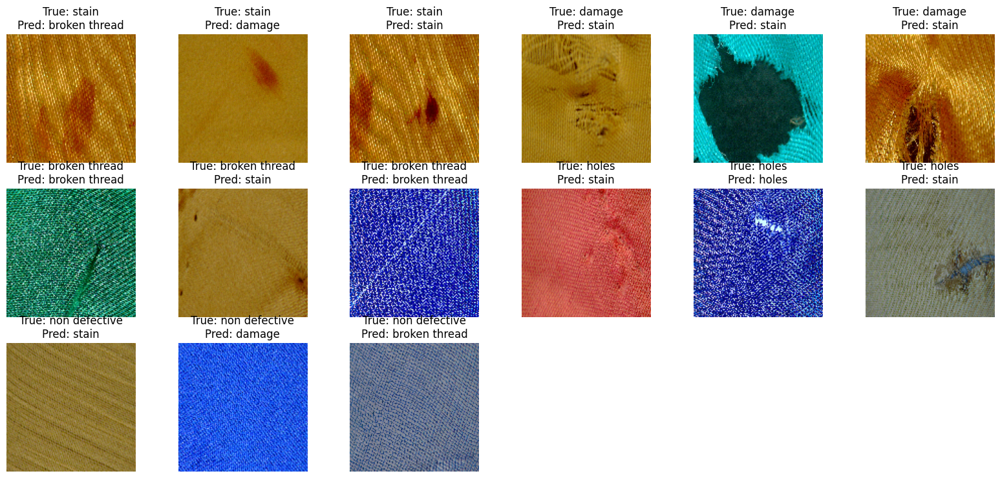

In [ ]:
import cv2
import numpy as np
from keras.models import load_model
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score
import matplotlib.pyplot as plt
import os

# Load the saved model
model_path = '/content/model_woven_Dyed.h5'
model = load_model(model_path)
print("Model loaded successfully.")

# Define categories and initialize lists to track true and predicted labels
categories = ['stain', 'damage', 'broken thread', 'holes', 'non defective']
true_labels = []
predicted_labels = []

# Function to preprocess and predict on a single image
def predict_defect(image_path):
    img = cv2.imread(image_path)
    img = cv2.resize(img, (28, 28))  # Resize to 28x28 pixels
    img = img.astype('float32') / 255.0  # Normalize
    img = img.reshape(1, -1, img.shape[2])  # Reshape for LSTM input

    # Predict the defect class
    prediction = model.predict(img)
    predicted_class = np.argmax(prediction, axis=1)[0]
    return predicted_class

# Load and predict on new test dataset
test_dir = '/content/Test/Woven/Dyed'
for category_index, category in enumerate(categories):
    category_path = os.path.join(test_dir, category)
    if not os.path.exists(category_path):
        print(f"Directory {category_path} does not exist. Skipping.")
        continue

    for img_file in os.listdir(category_path):
        img_path = os.path.join(category_path, img_file)
        if img_file.endswith('.jpg'):
            pred_label = predict_defect(img_path)
            true_labels.append(category_index)
            predicted_labels.append(pred_label)

# Get unique classes from the true and predicted labels
unique_labels = np.unique(np.concatenate((true_labels, predicted_labels)))

# Classification Report and Metrics
print("\nClassification Report:")
class_report = classification_report(
    true_labels,
    predicted_labels,
    labels=unique_labels,  # Use the unique labels
    target_names=categories,
    output_dict=True,
    zero_division=0
)

print(class_report)


# Confusion Matrix
conf_matrix = confusion_matrix(true_labels, predicted_labels)
print("\nConfusion Matrix:\n", conf_matrix)

# Class-Specific Accuracy
category_accuracies = {}
for i, category in enumerate(categories):
    mask = (np.array(true_labels) == i)
    correct_predictions = (np.array(predicted_labels)[mask] == i).sum()
    category_accuracies[category] = correct_predictions / mask.sum() if mask.sum() > 0 else 0
    print(f"Accuracy for {category}: {category_accuracies[category]:.2f}")

# Calculate overall metrics
accuracy_scores = accuracy_score(true_labels, predicted_labels)
f1_scores = f1_score(true_labels, predicted_labels, average=None)
print("\nOverall Accuracy Score: ", accuracy_scores)
print("F1 Scores: ", f1_scores)
print("Average F1 Score: ", np.mean(f1_scores))

# Plot Confusion Matrix
plt.figure(figsize=(8, 6))
plt.imshow(conf_matrix, interpolation='nearest', cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.colorbar()
plt.xticks(np.arange(len(categories)), categories, rotation=45)
plt.yticks(np.arange(len(categories)), categories)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

# Display sample images with true and predicted labels (3 images per category)
plt.figure(figsize=(20, 15))
displayed_count = {category: 0 for category in categories}
max_images_per_class = 3
displayed_images = 0

# Loop over the categories to display images
for category_index, category in enumerate(categories):
    category_path = os.path.join(test_dir, category)
    if not os.path.exists(category_path):
        print(f"Directory {category_path} does not exist. Skipping.")
        continue

    for img_file in os.listdir(category_path):
        if displayed_count[category] < max_images_per_class and img_file.endswith('.jpg'):
            img_path = os.path.join(category_path, img_file)
            print(f"Loading image: {img_path}")  # Print the image path for debugging
            img = cv2.imread(img_path)

            # Check if the image was loaded successfully
            if img is not None:
                img = cv2.resize(img, (128, 128))  # Resize for better display quality
                plt.subplot(5, 6, displayed_images + 1)
                plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB
                plt.title(f"True: {category}\nPred: {categories[predicted_labels[displayed_images]]}")
                plt.axis('off')

                displayed_count[category] += 1
                displayed_images += 1

                # Stop after showing 3 images per category
                if displayed_images >= max_images_per_class * len(categories):
                    break
            else:
                print(f"Warning: Image at path '{img_path}' could not be loaded.")  # Print a warning if the image fails to load

plt.show()


Image counts per category: {'stain': 300, 'damage': 300, 'broken thread': 300, 'holes': 300, 'non defective': 300}
Shape of trainX: (1200, 784, 3)
Shape of testX: (300, 784, 3)
Shape of trainY: (1200, 5)
Shape of testY: (300, 5)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_6 (LSTM)                        │ (None, 784, 128)            │          67,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 784, 128)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_6 (Conv1D)                    │ (None, 784, 64)             │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_6                │ (None, 784, 64)             │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_6 (MaxPooling1D)       │ (None, 392, 64)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_6 (Flatten)                  │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 5)                   │         125,445 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 217,925 (851.27 KB)

 Trainable params: 217,797 (850.77 KB)

 Non-trainable params: 128 (512.00 B)

None
Epoch 1/90
38/38 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.5457 - loss: 2.3677 - val_accuracy: 0.1700 - val_loss: 2.3525 - learning_rate: 0.0010
Epoch 2/90
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - accuracy: 0.7500 - loss: 1.5798 - val_accuracy: 0.4867 - val_loss: 2.0748 - learning_rate: 0.0010
Epoch 3/90
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - accuracy: 0.8383 - loss: 1.3250 - val_accuracy: 0.1733 - val_loss: 2.2258 - learning_rate: 0.0010
Epoch 4/90
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - accuracy: 0.8760 - loss: 1.0983 - val_accuracy: 0.3367 - val_loss: 1.9498 - learning_rate: 0.0010
Epoch 5/90
38/38 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - accuracy: 0.9230 - loss: 0.8983 - val_accuracy: 0.4133 - val_loss: 1.8344 - learning_rate: 0.0010
Epoch 6/90
38/38 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - accuracy: 0.9314 - loss: 0.8014 - val_accuracy: 0.4467 - val_loss: 1.7319 - learning_rate: 0.0010
Epoch 7/90
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - accuracy: 0.9462 - loss: 0.6981 - va

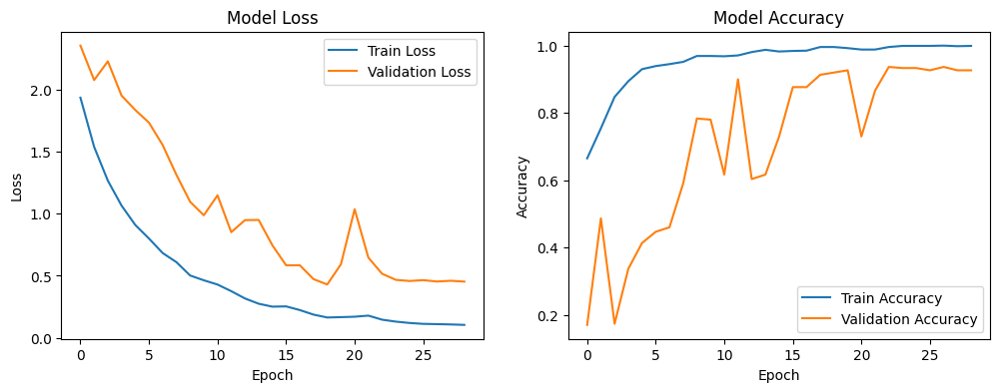

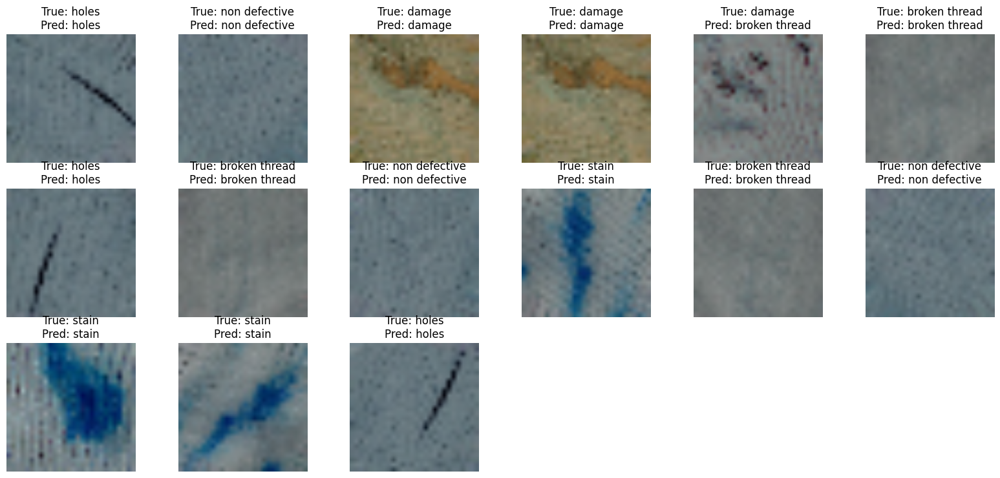

In [ ]:
#LSTM-CNN model
import os
import cv2
import numpy as np
import time
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout, Flatten, Conv1D, MaxPooling1D, BatchNormalization
from keras.utils import to_categorical
from keras.callbacks import ReduceLROnPlateau, EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score
import matplotlib.pyplot as plt

# Function to load the Kaggle image dataset in .jpg format
def load_dataset():
    base_dir = '/content/Train/Woven/Gray'
    categories = ['stain', 'damage', 'broken thread', 'holes', 'non defective']
    images = []
    labels = []
    category_counts = {category: 0 for category in categories}
    # To track the number of images per category

    for label, category in enumerate(categories):
        category_dir = os.path.join(base_dir, category)
        if not os.path.exists(category_dir):
            print(f"Directory {category_dir} does not exist. Skipping this category.")
            continue
        for filename in os.listdir(category_dir):
            if filename.endswith('.jpg'):
                img = cv2.imread(os.path.join(category_dir, filename))
                img = cv2.resize(img, (28, 28))  # Resize image to 28x28
                images.append(img)
                labels.append(label)
                category_counts[category] += 1  # Count the images for each category

    images = np.array(images)
    labels = np.array(labels)

    print("Image counts per category:", category_counts)  # Print the counts for debugging

    return images, labels, categories

# Load the Kaggle image dataset
images, labels, categories = load_dataset()

if len(images) == 0:
    raise ValueError("No images found. Please check the dataset path and ensure images are available.")

# Preprocess the images (normalize pixel values)
images = images.astype('float32') / 255.0

# Convert labels to one-hot encoding
labels = to_categorical(labels, num_classes=len(categories))

# Reshape images for LSTM input (assuming each image is treated as a sequence of pixels)
images = images.reshape(images.shape[0], -1, images.shape[3])  # Adjust to (batch_size, sequence_length, feature_dim)

# Split the dataset into training and test sets
trainX, testX, trainY, testY = train_test_split(images, labels, test_size=0.2, random_state=42)

# Verify shapes of trainX, testX, trainY, testY
print("Shape of trainX:", trainX.shape)
print("Shape of testX:", testX.shape)
print("Shape of trainY:", trainY.shape)
print("Shape of testY:", testY.shape)

# Define the single LSTM-CNN model
model = Sequential()
model.add(LSTM(128, input_shape=(trainX.shape[1], trainX.shape[2]), return_sequences=True))
model.add(Dropout(0.5))


# Ensure the input dimension is compatible with Conv1D
model.add(Conv1D(64, 3, activation='relu', padding='same', kernel_regularizer='l2'))
model.add(BatchNormalization())
model.add(MaxPooling1D(2))

# Flatten and add the output layer
model.add(Flatten())
model.add(Dense(len(categories), activation='softmax', kernel_regularizer='l2'))

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Print model summary
print(model.summary())

# Callbacks for learning rate reduction and early stopping
lr_reduction = ReduceLROnPlateau(monitor='val_loss', patience=3, verbose=1, factor=0.5, min_lr=0.000001)
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model
start_time = time.time()
history = model.fit(trainX, trainY, epochs=90, batch_size=32, validation_data=(testX, testY), callbacks=[lr_reduction, early_stopping], verbose=1)
end_time = time.time()

# Evaluate the model
loss, accuracy = model.evaluate(testX, testY, verbose=0)
print('Test Loss:', loss)
print('Test Accuracy:', accuracy)

# Get predictions for the test set
predY = model.predict(testX)
predY_classes = np.argmax(predY, axis=1)
trueY_classes = np.argmax(testY, axis=1)

# Ensure we only use labels present in the test set
unique_true_labels = np.unique(trueY_classes)

# Print classification report
class_report = classification_report(
    trueY_classes, predY_classes,
    target_names=[categories[i] for i in unique_true_labels],
    output_dict=True,
    zero_division=0
)
print(class_report)

# Print confusion matrix
conf_matrix = confusion_matrix(trueY_classes, predY_classes)
print(conf_matrix)

# Calculate and print additional metrics
accuracy_scores = accuracy_score(trueY_classes, predY_classes)
f1_scores = f1_score(trueY_classes, predY_classes, average=None)

print("Accuracy Scores: ", accuracy_scores)
print("F1 Scores: ", f1_scores)
print("Average F1 Score: ", np.mean(f1_scores))

# Calculate and display accuracy for each category
category_accuracies = {}
for i, category in enumerate(categories):
    category_mask = (trueY_classes == i)
    category_correct = (predY_classes[category_mask] == i).sum()
    category_total = category_mask.sum()
    category_accuracies[category] = category_correct / category_total
    print(f"Accuracy for {category}: {category_accuracies[category]:.2f}")

print(f"Total Training Time: {end_time - start_time} seconds")

# Plot training & validation loss and accuracy values
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper right')

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')

plt.show()

# Visualize test images with improved pixel quality and ensure class representation
plt.figure(figsize=(20, 15))

# Dictionary to track how many images have been displayed per class
displayed_count = {category: 0 for category in categories}

# Maximum number of images to display per class
max_images_per_class = 3

displayed_images = 0
for i in range(len(testX)):
    true_label = categories[trueY_classes[i]]
    if displayed_count[true_label] < max_images_per_class:
        plt.subplot(5, 6, displayed_images + 1)  # Adjusting the grid for 18 images
        resized_image = cv2.resize(testX[i].reshape(28, 28, 3), (128, 128))  # Rescale for better quality
        plt.imshow(resized_image)
        plt.title(f"True: {true_label}\nPred: {categories[predY_classes[i]]}")
        plt.axis('off')

        displayed_count[true_label] += 1
        displayed_images += 1

    # Break the loop after displaying 18 images (3 images per class, 6 classes)
    if displayed_images >= max_images_per_class * len(categories):
        break

plt.show()


In [ ]:
# Save the trained model in .h5 format for Raspberry Pi
model.save('/content/model_woven_Gray.h5')
print("Model saved in .h5 format.")


Model saved in .h5 format.


Model loaded successfully.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━

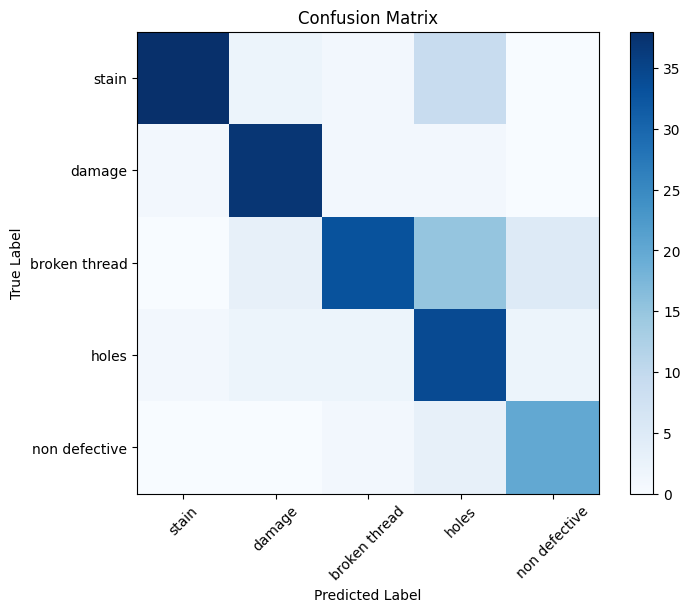

Loading image: /content/Test/Woven/Gray/stain/WIN_20241028_19_46_34_Pro.jpg
Loading image: /content/Test/Woven/Gray/stain/WIN_20241018_14_17_08_Pro.jpg
Loading image: /content/Test/Woven/Gray/stain/WIN_20241029_13_50_49_Pro.jpg
Loading image: /content/Test/Woven/Gray/damage/WIN_20240729_12_39_10_Pro.jpg
Loading image: /content/Test/Woven/Gray/damage/WIN_20241029_13_52_05_Pro.jpg
Loading image: /content/Test/Woven/Gray/damage/WIN_20240720_13_12_11_Pro.jpg
Loading image: /content/Test/Woven/Gray/broken thread/WIN_20241029_13_31_24_Pro.jpg
Loading image: /content/Test/Woven/Gray/broken thread/WIN_20241018_14_15_57_Pro.jpg
Loading image: /content/Test/Woven/Gray/broken thread/WIN_20241029_13_17_50_Pro.jpg
Loading image: /content/Test/Woven/Gray/holes/WIN_20241018_14_02_46_Pro.jpg
Loading image: /content/Test/Woven/Gray/holes/WIN_20240802_21_15_39_Pro.jpg
Loading image: /content/Test/Woven/Gray/holes/WIN_20241028_19_37_53_Pro.jpg
Loading image: /content/Test/Woven/Gray/non defective/WIN_202

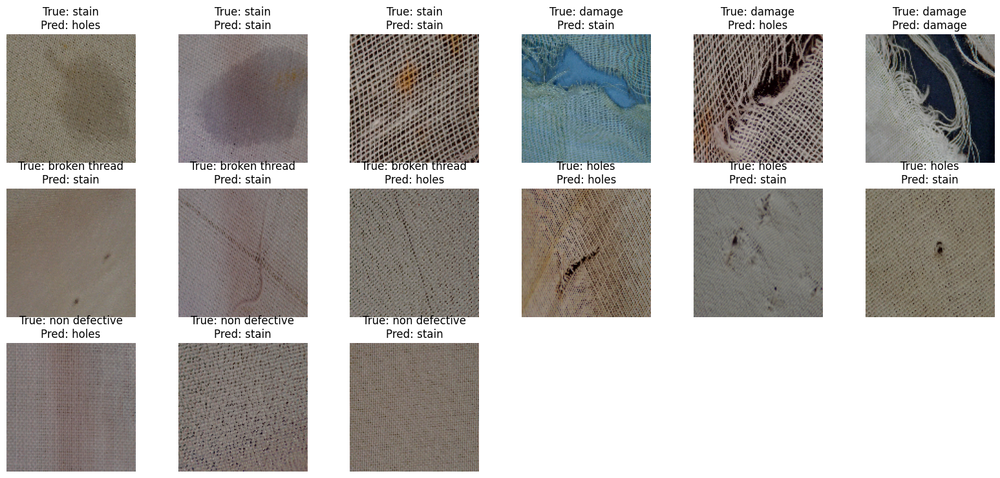

In [ ]:
import cv2
import numpy as np
from keras.models import load_model
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score
import matplotlib.pyplot as plt
import os

# Load the saved model
model_path = '/content/model_woven_Gray.h5'
model = load_model(model_path)
print("Model loaded successfully.")

# Define categories and initialize lists to track true and predicted labels
categories = ['stain', 'damage', 'broken thread', 'holes', 'non defective']
true_labels = []
predicted_labels = []

# Function to preprocess and predict on a single image
def predict_defect(image_path):
    img = cv2.imread(image_path)
    img = cv2.resize(img, (28, 28))  # Resize to 28x28 pixels
    img = img.astype('float32') / 255.0  # Normalize
    img = img.reshape(1, -1, img.shape[2])  # Reshape for LSTM input

    # Predict the defect class
    prediction = model.predict(img)
    predicted_class = np.argmax(prediction, axis=1)[0]
    return predicted_class

# Load and predict on new test dataset
test_dir = '/content/Test/Woven/Gray'
for category_index, category in enumerate(categories):
    category_path = os.path.join(test_dir, category)
    if not os.path.exists(category_path):
        print(f"Directory {category_path} does not exist. Skipping.")
        continue

    for img_file in os.listdir(category_path):
        img_path = os.path.join(category_path, img_file)
        if img_file.endswith('.jpg'):
            pred_label = predict_defect(img_path)
            true_labels.append(category_index)
            predicted_labels.append(pred_label)

# Get unique classes from the true and predicted labels
unique_labels = np.unique(np.concatenate((true_labels, predicted_labels)))

# Classification Report and Metrics
print("\nClassification Report:")
class_report = classification_report(
    true_labels,
    predicted_labels,
    labels=unique_labels,  # Use the unique labels
    target_names=categories,
    output_dict=True,
    zero_division=0
)

print(class_report)


# Confusion Matrix
conf_matrix = confusion_matrix(true_labels, predicted_labels)
print("\nConfusion Matrix:\n", conf_matrix)

# Class-Specific Accuracy
category_accuracies = {}
for i, category in enumerate(categories):
    mask = (np.array(true_labels) == i)
    correct_predictions = (np.array(predicted_labels)[mask] == i).sum()
    category_accuracies[category] = correct_predictions / mask.sum() if mask.sum() > 0 else 0
    print(f"Accuracy for {category}: {category_accuracies[category]:.2f}")

# Calculate overall metrics
accuracy_scores = accuracy_score(true_labels, predicted_labels)
f1_scores = f1_score(true_labels, predicted_labels, average=None)
print("\nOverall Accuracy Score: ", accuracy_scores)
print("F1 Scores: ", f1_scores)
print("Average F1 Score: ", np.mean(f1_scores))

# Plot Confusion Matrix
plt.figure(figsize=(8, 6))
plt.imshow(conf_matrix, interpolation='nearest', cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.colorbar()
plt.xticks(np.arange(len(categories)), categories, rotation=45)
plt.yticks(np.arange(len(categories)), categories)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

# Display sample images with true and predicted labels (3 images per category)
plt.figure(figsize=(20, 15))
displayed_count = {category: 0 for category in categories}
max_images_per_class = 3
displayed_images = 0

# Loop over the categories to display images
for category_index, category in enumerate(categories):
    category_path = os.path.join(test_dir, category)
    if not os.path.exists(category_path):
        print(f"Directory {category_path} does not exist. Skipping.")
        continue

    for img_file in os.listdir(category_path):
        if displayed_count[category] < max_images_per_class and img_file.endswith('.jpg'):
            img_path = os.path.join(category_path, img_file)
            print(f"Loading image: {img_path}")  # Print the image path for debugging
            img = cv2.imread(img_path)

            # Check if the image was loaded successfully
            if img is not None:
                img = cv2.resize(img, (128, 128))  # Resize for better display quality
                plt.subplot(5, 6, displayed_images + 1)
                plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB
                plt.title(f"True: {category}\nPred: {categories[predicted_labels[displayed_images]]}")
                plt.axis('off')

                displayed_count[category] += 1
                displayed_images += 1

                # Stop after showing 3 images per category
                if displayed_images >= max_images_per_class * len(categories):
                    break
            else:
                print(f"Warning: Image at path '{img_path}' could not be loaded.")  # Print a warning if the image fails to load

plt.show()


Image counts per category: {'stain': 300, 'damage': 300, 'broken thread': 300, 'holes': 300, 'non defective': 300}
Shape of trainX: (1200, 784, 3)
Shape of testX: (300, 784, 3)
Shape of trainY: (1200, 5)
Shape of testY: (300, 5)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_7 (LSTM)                        │ (None, 784, 128)            │          67,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 784, 128)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_7 (Conv1D)                    │ (None, 784, 64)             │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_7                │ (None, 784, 64)             │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_7 (MaxPooling1D)       │ (None, 392, 64)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_7 (Flatten)                  │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 5)                   │         125,445 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 217,925 (851.27 KB)

 Trainable params: 217,797 (850.77 KB)

 Non-trainable params: 128 (512.00 B)

None
Epoch 1/90
38/38 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step - accuracy: 0.5897 - loss: 2.7559 - val_accuracy: 0.2833 - val_loss: 2.4599 - learning_rate: 0.0010
Epoch 2/90
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - accuracy: 0.7852 - loss: 1.7064 - val_accuracy: 0.3867 - val_loss: 2.3264 - learning_rate: 0.0010
Epoch 3/90
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - accuracy: 0.8365 - loss: 1.3785 - val_accuracy: 0.6367 - val_loss: 2.1869 - learning_rate: 0.0010
Epoch 4/90
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - accuracy: 0.8317 - loss: 1.2959 - val_accuracy: 0.5133 - val_loss: 2.0751 - learning_rate: 0.0010
Epoch 5/90
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - accuracy: 0.8684 - loss: 1.0663 - val_accuracy: 0.6267 - val_loss: 1.9771 - learning_rate: 0.0010
Epoch 6/90
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - accuracy: 0.8561 - loss: 0.9996 - val_accuracy: 0.7367 - val_loss: 1.7886 - learning_rate: 0.0010
Epoch 7/90
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - accuracy: 0.9098 - loss: 0.8139 - va

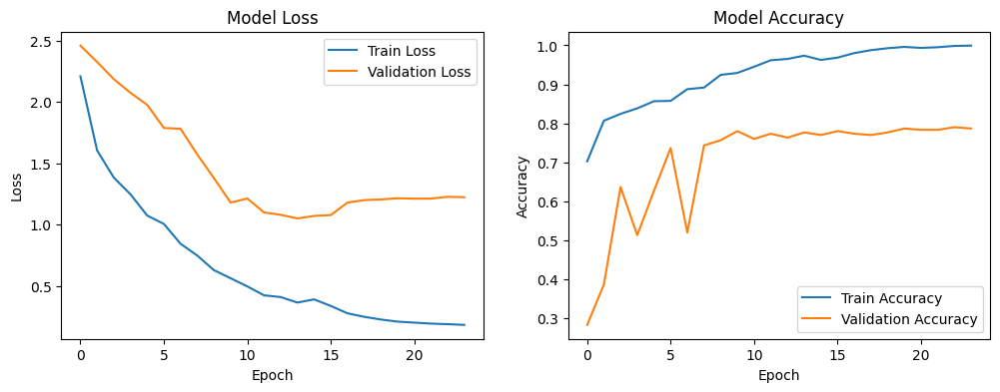

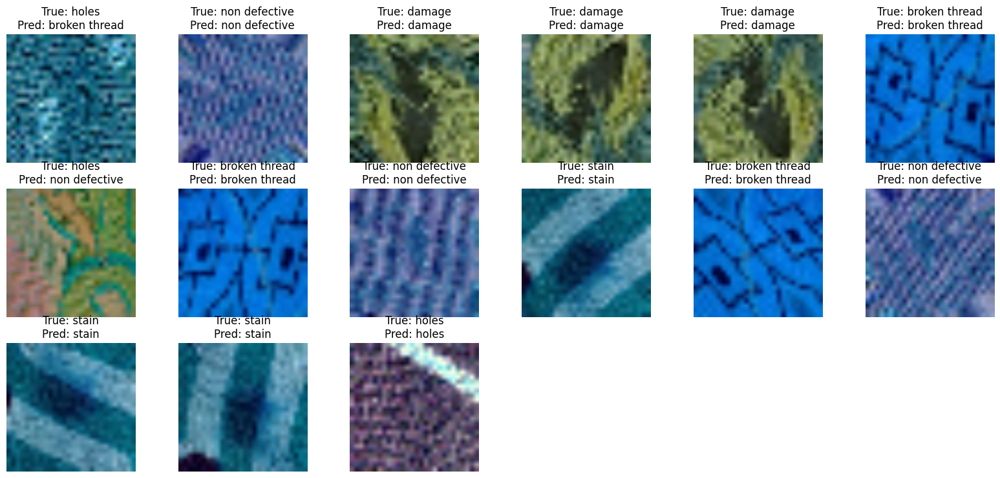

In [ ]:
#LSTM-CNN model
import os
import cv2
import numpy as np
import time
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout, Flatten, Conv1D, MaxPooling1D, BatchNormalization
from keras.utils import to_categorical
from keras.callbacks import ReduceLROnPlateau, EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score
import matplotlib.pyplot as plt

# Function to load the Kaggle image dataset in .jpg format
def load_dataset():
    base_dir = '/content/Train/Woven/Printed'
    categories = ['stain', 'damage', 'broken thread', 'holes', 'non defective']
    images = []
    labels = []
    category_counts = {category: 0 for category in categories}
    # To track the number of images per category

    for label, category in enumerate(categories):
        category_dir = os.path.join(base_dir, category)
        if not os.path.exists(category_dir):
            print(f"Directory {category_dir} does not exist. Skipping this category.")
            continue
        for filename in os.listdir(category_dir):
            if filename.endswith('.jpg'):
                img = cv2.imread(os.path.join(category_dir, filename))
                img = cv2.resize(img, (28, 28))  # Resize image to 28x28
                images.append(img)
                labels.append(label)
                category_counts[category] += 1  # Count the images for each category

    images = np.array(images)
    labels = np.array(labels)

    print("Image counts per category:", category_counts)  # Print the counts for debugging

    return images, labels, categories

# Load the Kaggle image dataset
images, labels, categories = load_dataset()

if len(images) == 0:
    raise ValueError("No images found. Please check the dataset path and ensure images are available.")

# Preprocess the images (normalize pixel values)
images = images.astype('float32') / 255.0

# Convert labels to one-hot encoding
labels = to_categorical(labels, num_classes=len(categories))

# Reshape images for LSTM input (assuming each image is treated as a sequence of pixels)
images = images.reshape(images.shape[0], -1, images.shape[3])  # Adjust to (batch_size, sequence_length, feature_dim)

# Split the dataset into training and test sets
trainX, testX, trainY, testY = train_test_split(images, labels, test_size=0.2, random_state=42)

# Verify shapes of trainX, testX, trainY, testY
print("Shape of trainX:", trainX.shape)
print("Shape of testX:", testX.shape)
print("Shape of trainY:", trainY.shape)
print("Shape of testY:", testY.shape)

# Define the single LSTM-CNN model
model = Sequential()
model.add(LSTM(128, input_shape=(trainX.shape[1], trainX.shape[2]), return_sequences=True))
model.add(Dropout(0.5))


# Ensure the input dimension is compatible with Conv1D
model.add(Conv1D(64, 3, activation='relu', padding='same', kernel_regularizer='l2'))
model.add(BatchNormalization())
model.add(MaxPooling1D(2))

# Flatten and add the output layer
model.add(Flatten())
model.add(Dense(len(categories), activation='softmax', kernel_regularizer='l2'))

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Print model summary
print(model.summary())

# Callbacks for learning rate reduction and early stopping
lr_reduction = ReduceLROnPlateau(monitor='val_loss', patience=3, verbose=1, factor=0.5, min_lr=0.000001)
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model
start_time = time.time()
history = model.fit(trainX, trainY, epochs=90, batch_size=32, validation_data=(testX, testY), callbacks=[lr_reduction, early_stopping], verbose=1)
end_time = time.time()

# Evaluate the model
loss, accuracy = model.evaluate(testX, testY, verbose=0)
print('Test Loss:', loss)
print('Test Accuracy:', accuracy)

# Get predictions for the test set
predY = model.predict(testX)
predY_classes = np.argmax(predY, axis=1)
trueY_classes = np.argmax(testY, axis=1)

# Ensure we only use labels present in the test set
unique_true_labels = np.unique(trueY_classes)

# Print classification report
class_report = classification_report(
    trueY_classes, predY_classes,
    target_names=[categories[i] for i in unique_true_labels],
    output_dict=True,
    zero_division=0
)
print(class_report)

# Print confusion matrix
conf_matrix = confusion_matrix(trueY_classes, predY_classes)
print(conf_matrix)

# Calculate and print additional metrics
accuracy_scores = accuracy_score(trueY_classes, predY_classes)
f1_scores = f1_score(trueY_classes, predY_classes, average=None)

print("Accuracy Scores: ", accuracy_scores)
print("F1 Scores: ", f1_scores)
print("Average F1 Score: ", np.mean(f1_scores))

# Calculate and display accuracy for each category
category_accuracies = {}
for i, category in enumerate(categories):
    category_mask = (trueY_classes == i)
    category_correct = (predY_classes[category_mask] == i).sum()
    category_total = category_mask.sum()
    category_accuracies[category] = category_correct / category_total
    print(f"Accuracy for {category}: {category_accuracies[category]:.2f}")

print(f"Total Training Time: {end_time - start_time} seconds")

# Plot training & validation loss and accuracy values
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper right')

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')

plt.show()

# Visualize test images with improved pixel quality and ensure class representation
plt.figure(figsize=(20, 15))

# Dictionary to track how many images have been displayed per class
displayed_count = {category: 0 for category in categories}

# Maximum number of images to display per class
max_images_per_class = 3

displayed_images = 0
for i in range(len(testX)):
    true_label = categories[trueY_classes[i]]
    if displayed_count[true_label] < max_images_per_class:
        plt.subplot(5, 6, displayed_images + 1)  # Adjusting the grid for 18 images
        resized_image = cv2.resize(testX[i].reshape(28, 28, 3), (128, 128))  # Rescale for better quality
        plt.imshow(resized_image)
        plt.title(f"True: {true_label}\nPred: {categories[predY_classes[i]]}")
        plt.axis('off')

        displayed_count[true_label] += 1
        displayed_images += 1

    # Break the loop after displaying 18 images (3 images per class, 6 classes)
    if displayed_images >= max_images_per_class * len(categories):
        break

plt.show()


In [ ]:
# Save the trained model in .h5 format for Raspberry Pi
model.save('/content/model_woven_Printed.h5')
print("Model saved in .h5 format.")


Model saved in .h5 format.


Model loaded successfully.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━

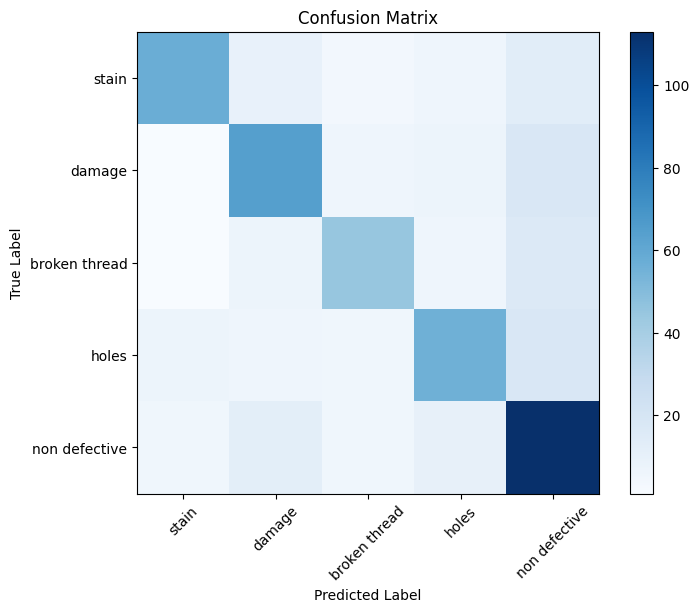

Loading image: /content/Test/Woven/Printed/stain/WIN_20241018_12_08_36_Pro.jpg
Loading image: /content/Test/Woven/Printed/stain/WIN_20241018_11_39_23_Pro.jpg
Loading image: /content/Test/Woven/Printed/stain/WIN_20241018_14_26_48_Pro.jpg
Loading image: /content/Test/Woven/Printed/damage/WIN_20241028_21_32_30_Pro.jpg
Loading image: /content/Test/Woven/Printed/damage/WIN_20241028_21_43_17_Pro.jpg
Loading image: /content/Test/Woven/Printed/damage/WIN_20241028_21_58_51_Pro.jpg
Loading image: /content/Test/Woven/Printed/broken thread/WIN_20241028_21_56_31_Pro.jpg
Loading image: /content/Test/Woven/Printed/broken thread/WIN_20241018_11_49_41_Pro.jpg
Loading image: /content/Test/Woven/Printed/broken thread/WIN_20241028_21_56_39_Pro.jpg
Loading image: /content/Test/Woven/Printed/holes/WIN_20241028_20_27_04_Pro.jpg
Loading image: /content/Test/Woven/Printed/holes/WIN_20241028_21_57_52_Pro.jpg
Loading image: /content/Test/Woven/Printed/holes/WIN_20241028_20_27_55_Pro.jpg
Loading image: /content/T

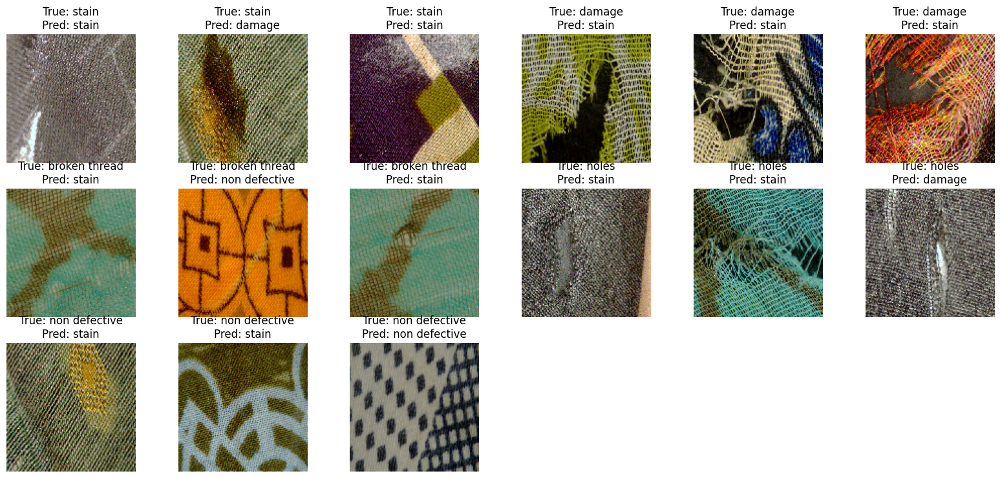

In [ ]:
import cv2
import numpy as np
from keras.models import load_model
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score
import matplotlib.pyplot as plt
import os

# Load the saved model
model_path = '/content/model_woven_Printed.h5'
model = load_model(model_path)
print("Model loaded successfully.")

# Define categories and initialize lists to track true and predicted labels
categories = ['stain', 'damage', 'broken thread', 'holes', 'non defective']
true_labels = []
predicted_labels = []

# Function to preprocess and predict on a single image
def predict_defect(image_path):
    img = cv2.imread(image_path)
    img = cv2.resize(img, (28, 28))  # Resize to 28x28 pixels
    img = img.astype('float32') / 255.0  # Normalize
    img = img.reshape(1, -1, img.shape[2])  # Reshape for LSTM input

    # Predict the defect class
    prediction = model.predict(img)
    predicted_class = np.argmax(prediction, axis=1)[0]
    return predicted_class

# Load and predict on new test dataset
test_dir = '/content/Test/Woven/Printed'
for category_index, category in enumerate(categories):
    category_path = os.path.join(test_dir, category)
    if not os.path.exists(category_path):
        print(f"Directory {category_path} does not exist. Skipping.")
        continue

    for img_file in os.listdir(category_path):
        img_path = os.path.join(category_path, img_file)
        if img_file.endswith('.jpg'):
            pred_label = predict_defect(img_path)
            true_labels.append(category_index)
            predicted_labels.append(pred_label)

# Get unique classes from the true and predicted labels
unique_labels = np.unique(np.concatenate((true_labels, predicted_labels)))

# Classification Report and Metrics
print("\nClassification Report:")
class_report = classification_report(
    true_labels,
    predicted_labels,
    labels=unique_labels,  # Use the unique labels
    target_names=categories,
    output_dict=True,
    zero_division=0
)

print(class_report)


# Confusion Matrix
conf_matrix = confusion_matrix(true_labels, predicted_labels)
print("\nConfusion Matrix:\n", conf_matrix)

# Class-Specific Accuracy
category_accuracies = {}
for i, category in enumerate(categories):
    mask = (np.array(true_labels) == i)
    correct_predictions = (np.array(predicted_labels)[mask] == i).sum()
    category_accuracies[category] = correct_predictions / mask.sum() if mask.sum() > 0 else 0
    print(f"Accuracy for {category}: {category_accuracies[category]:.2f}")

# Calculate overall metrics
accuracy_scores = accuracy_score(true_labels, predicted_labels)
f1_scores = f1_score(true_labels, predicted_labels, average=None)
print("\nOverall Accuracy Score: ", accuracy_scores)
print("F1 Scores: ", f1_scores)
print("Average F1 Score: ", np.mean(f1_scores))

# Plot Confusion Matrix
plt.figure(figsize=(8, 6))
plt.imshow(conf_matrix, interpolation='nearest', cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.colorbar()
plt.xticks(np.arange(len(categories)), categories, rotation=45)
plt.yticks(np.arange(len(categories)), categories)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

# Display sample images with true and predicted labels (3 images per category)
plt.figure(figsize=(20, 15))
displayed_count = {category: 0 for category in categories}
max_images_per_class = 3
displayed_images = 0

# Loop over the categories to display images
for category_index, category in enumerate(categories):
    category_path = os.path.join(test_dir, category)
    if not os.path.exists(category_path):
        print(f"Directory {category_path} does not exist. Skipping.")
        continue

    for img_file in os.listdir(category_path):
        if displayed_count[category] < max_images_per_class and img_file.endswith('.jpg'):
            img_path = os.path.join(category_path, img_file)
            print(f"Loading image: {img_path}")  # Print the image path for debugging
            img = cv2.imread(img_path)

            # Check if the image was loaded successfully
            if img is not None:
                img = cv2.resize(img, (128, 128))  # Resize for better display quality
                plt.subplot(5, 6, displayed_images + 1)
                plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB
                plt.title(f"True: {category}\nPred: {categories[predicted_labels[displayed_images]]}")
                plt.axis('off')

                displayed_count[category] += 1
                displayed_images += 1

                # Stop after showing 3 images per category
                if displayed_images >= max_images_per_class * len(categories):
                    break
            else:
                print(f"Warning: Image at path '{img_path}' could not be loaded.")  # Print a warning if the image fails to load

plt.show()


Select the fabric defect type you want to detect:
1. knitted_Gray
2. knitted_printed
3. knitted_Dyed
4. woven_Gray
5. woven_Printed
6. woven_Dyed
Enter the number corresponding to your choice: 1


Model for 'knitted_Gray' loaded successfully.
Enter the path to the test dataset: /content/Test/Knitted/Gray
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━

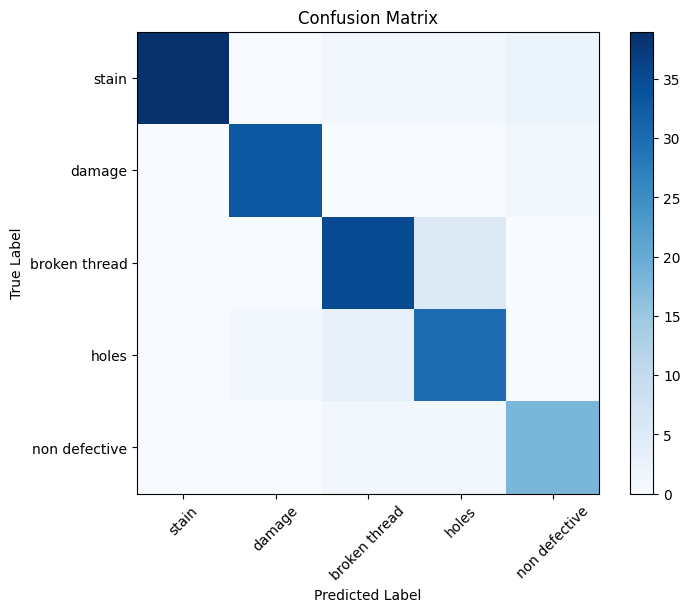

Loading image: /content/Test/Knitted/Gray/stain/WIN_20241029_17_21_26_Pro.jpg
Loading image: /content/Test/Knitted/Gray/stain/WIN_20241028_21_30_32_Pro.jpg
Loading image: /content/Test/Knitted/Gray/stain/WIN_20241028_19_34_55_Pro.jpg
Loading image: /content/Test/Knitted/Gray/damage/WIN_20241028_21_26_55_Pro.jpg
Loading image: /content/Test/Knitted/Gray/damage/WIN_20241028_21_38_06_Pro.jpg
Loading image: /content/Test/Knitted/Gray/damage/WIN_20241028_21_27_04_Pro.jpg
Loading image: /content/Test/Knitted/Gray/broken thread/WIN_20241028_20_10_43_Pro.jpg
Loading image: /content/Test/Knitted/Gray/broken thread/WIN_20241029_16_23_05_Pro.jpg
Loading image: /content/Test/Knitted/Gray/broken thread/WIN_20241028_19_14_16_Pro.jpg
Loading image: /content/Test/Knitted/Gray/holes/WIN_20241029_16_22_03_Pro.jpg
Loading image: /content/Test/Knitted/Gray/holes/WIN_20241028_19_27_35_Pro.jpg
Loading image: /content/Test/Knitted/Gray/holes/WIN_20241028_19_28_25_Pro.jpg
Loading image: /content/Test/Knitted/

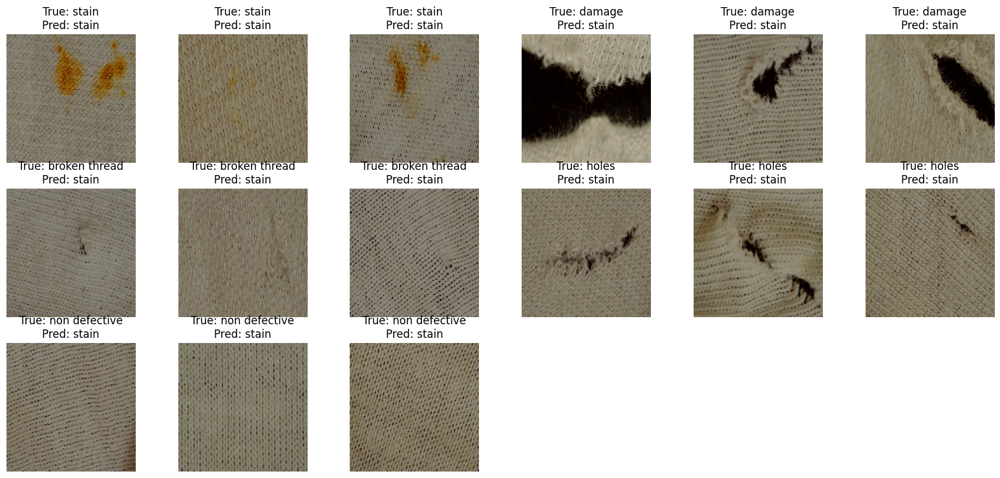

In [ ]:
import cv2
import numpy as np
from keras.models import load_model
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score
import matplotlib.pyplot as plt
import os

# Define models and their associated fabric types
fabric_models = {
    "1": ("/content/model_knitted_Gray.h5", "knitted_Gray"),
    "2": ("/content/model_knitted_printed.h5", "knitted_printed"),
    "3": ("/content/model_KNITTED_dyed.h5", "knitted_Dyed"),
    "4": ("/content/model_woven_Gray.h5", "woven_Gray"),
    "5": ("/content/model_woven_Printed.h5", "woven_Printed"),
    "6": ("/content/model_woven_Gray.h5", "woven_Dyed")
}

# Display options to the user
print("Select the fabric defect type you want to detect:")
for key, (model_name, fabric_type) in fabric_models.items():
    print(f"{key}. {fabric_type}")

# Get user input for fabric type selection
choice = input("Enter the number corresponding to your choice: ")

# Check if the choice is valid
if choice not in fabric_models:
    print("Invalid choice. Exiting.")
else:
    # Load the selected model and fabric type
    model_path, selected_fabric_type = fabric_models[choice]
    model = load_model(model_path)
    print(f"Model for '{selected_fabric_type}' loaded successfully.")

    # Prompt user to input the path to the test dataset
    test_dir = input("Enter the path to the test dataset: ")

    # Define categories and initialize lists to track true and predicted labels
    categories = ['stain', 'damage', 'broken thread', 'holes', 'non defective']
    true_labels = []
    predicted_labels = []

    # Function to preprocess and predict on a single image
    def predict_defect(image_path):
        img = cv2.imread(image_path)
        img = cv2.resize(img, (28, 28))  # Resize to 28x28 pixels
        img = img.astype('float32') / 255.0  # Normalize
        img = img.reshape(1, -1, img.shape[2])  # Reshape for LSTM input

        # Predict the defect class
        prediction = model.predict(img)
        predicted_class = np.argmax(prediction, axis=1)[0]
        return predicted_class

    # Load and predict on new test dataset
    for category_index, category in enumerate(categories):
        category_path = os.path.join(test_dir, category)
        if not os.path.exists(category_path):
            print(f"Directory {category_path} does not exist. Skipping.")
            continue

        for img_file in os.listdir(category_path):
            img_path = os.path.join(category_path, img_file)
            if img_file.endswith('.jpg'):
                pred_label = predict_defect(img_path)
                true_labels.append(category_index)
                predicted_labels.append(pred_label)

    # Get unique classes from the true and predicted labels
    unique_labels = np.unique(np.concatenate((true_labels, predicted_labels)))

    # Classification Report and Metrics
    print("\nClassification Report:")
    class_report = classification_report(
        true_labels,
        predicted_labels,
        labels=unique_labels,  # Use the unique labels
        target_names=categories,
        output_dict=True,
        zero_division=0
    )
    print(class_report)

    # Confusion Matrix
    conf_matrix = confusion_matrix(true_labels, predicted_labels)
    print("\nConfusion Matrix:\n", conf_matrix)

    # Class-Specific Accuracy
    category_accuracies = {}
    for i, category in enumerate(categories):
        mask = (np.array(true_labels) == i)
        correct_predictions = (np.array(predicted_labels)[mask] == i).sum()
        category_accuracies[category] = correct_predictions / mask.sum() if mask.sum() > 0 else 0
        print(f"Accuracy for {category}: {category_accuracies[category]:.2f}")

    # Calculate overall metrics
    accuracy_scores = accuracy_score(true_labels, predicted_labels)
    f1_scores = f1_score(true_labels, predicted_labels, average=None)
    print("\nOverall Accuracy Score: ", accuracy_scores)
    print("F1 Scores: ", f1_scores)
    print("Average F1 Score: ", np.mean(f1_scores))

    # Plot Confusion Matrix
    plt.figure(figsize=(8, 6))
    plt.imshow(conf_matrix, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title("Confusion Matrix")
    plt.colorbar()
    plt.xticks(np.arange(len(categories)), categories, rotation=45)
    plt.yticks(np.arange(len(categories)), categories)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()
# Display sample images with true and predicted labels (3 images per category)
plt.figure(figsize=(20, 15))
displayed_count = {category: 0 for category in categories}
max_images_per_class = 3
displayed_images = 0

# Loop over the categories to display images
for category_index, category in enumerate(categories):
    category_path = os.path.join(test_dir, category)
    if not os.path.exists(category_path):
        print(f"Directory {category_path} does not exist. Skipping.")
        continue

    for img_file in os.listdir(category_path):
        if displayed_count[category] < max_images_per_class and img_file.endswith('.jpg'):
            img_path = os.path.join(category_path, img_file)
            print(f"Loading image: {img_path}")  # Print the image path for debugging
            img = cv2.imread(img_path)

            # Check if the image was loaded successfully
            if img is not None:
                img = cv2.resize(img, (128, 128))  # Resize for better display quality
                plt.subplot(5, 6, displayed_images + 1)
                plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB
                plt.title(f"True: {category}\nPred: {categories[predicted_labels[displayed_images]]}")
                plt.axis('off')

                displayed_count[category] += 1
                displayed_images += 1

                # Stop after showing 3 images per category
                if displayed_images >= max_images_per_class * len(categories):
                    break
            else:
                print(f"Warning: Image at path '{img_path}' could not be loaded.")  # Print a warning if the image fails to load

plt.show()


In [ ]:
pip install streamlit


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.3/44.3 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.6/8.6 MB 105.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 63.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.1/79.1 kB 7.8 MB/s eta 0:00:00


In [ ]:
!pip install streamlit groq


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.9/108.9 kB 9.6 MB/s eta 0:00:00


In [ ]:
import streamlit as st
import os
import cv2
import numpy as np
from keras.models import load_model
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt

# Set background color
st.markdown(
    """
    <style>
    body {
        background-color: #d3d3d3;  /* Medium gray color */
    }
    .fixed-left-panel {
        position: fixed;
        top: 50px;
        left: 10px;
        width: 250px;
        font-size: 16px;
        color: #000;
        font-weight: bold;
    }
    .main-heading {
        text-align: center;
        font-size: 28px;
        font-weight: bold;
    }
    .sub-heading {
        text-align: center;
        font-size: 20px;
        font-weight: bold;
        margin-top: -15px;
    }
    </style>
    """,
    unsafe_allow_html=True,
)

# Add fixed left panel
st.markdown(
    """
    <div class="fixed-left-panel">
        Designed and proposed by:<br>Sobouhi Ashraf
    </div>
    """,
    unsafe_allow_html=True,
)

# Add main heading and subheading
st.markdown('<div class="main-heading">NED University</div>', unsafe_allow_html=True)
st.markdown('<div class="sub-heading">Fabric Defect Identification and Classification</div>', unsafe_allow_html=True)

# Define models and their associated fabric types
fabric_models = {
    "1": ("model_knitted_Gray.h5", "knitted_Gray"),
    "2": ("model_knitted_printed.h5", "knitted_printed"),
    "3": ("model_defect_detection.h5", "knitted_Dyed"),
    "4": ("model_woven_Gray.h5", "woven_Gray"),
    "5": ("model_woven_Printed.h5", "woven_Printed"),
    "6": ("model_woven_Dyed.h5", "woven_Dyed")
}

# Streamlit interface
st.title("Fabric Defect Detection")

# Step 1: User selects the fabric defect model
fabric_choice = st.selectbox(
    "Select the fabric defect type you want to detect:",
    list(fabric_models.keys()),
    format_func=lambda x: fabric_models[x][1]
)

# Load the selected model based on user choice
model_path, selected_fabric_type = fabric_models[fabric_choice]
try:
    model = load_model(model_path)
    st.success(f"Model for '{selected_fabric_type}' loaded successfully.")
except Exception as e:
    st.error(f"Error loading model: {str(e)}")

# Step 2: Upload the test dataset directory
test_dir = st.text_input("Enter the path to the test dataset:")
st.write("Example path: /path/to/your/test/dataset")

# Function to preprocess and predict on a single image
def predict_defect(image_path):
    img = cv2.imread(image_path)
    img = cv2.resize(img, (28, 28))  # Resize to 28x28 pixels
    img = img.astype('float32') / 255.0  # Normalize
    img = img.reshape(1, -1, img.shape[2])  # Reshape for LSTM input
    prediction = model.predict(img)
    predicted_class = np.argmax(prediction, axis=1)[0]
    return predicted_class

# Step 3: Run predictions if dataset path is valid
if test_dir and os.path.isdir(test_dir):
    categories = ['stain', 'damage', 'broken thread', 'holes', 'non defective']
    true_labels = []
    predicted_labels = []

    for category_index, category in enumerate(categories):
        category_path = os.path.join(test_dir, category)
        if not os.path.exists(category_path):
            st.warning(f"Directory {category_path} does not exist. Skipping.")
            continue

        for img_file in os.listdir(category_path):
            img_path = os.path.join(category_path, img_file)
            if img_file.endswith('.jpg'):
                pred_label = predict_defect(img_path)
                true_labels.append(category_index)
                predicted_labels.append(pred_label)

    # Generate classification report and display it
    unique_labels = np.unique(np.concatenate((true_labels, predicted_labels)))
    class_report = classification_report(
        true_labels,
        predicted_labels,
        labels=unique_labels,
        target_names=categories,
        zero_division=0
    )
    st.text("Classification Report:")
    st.text(class_report)

    # Display confusion matrix
    conf_matrix = confusion_matrix(true_labels, predicted_labels)
    st.text("Confusion Matrix:")
    st.write(conf_matrix)

    # Plot Confusion Matrix
    fig, ax = plt.subplots()
    ax.imshow(conf_matrix, interpolation='nearest', cmap=plt.cm.Blues)
    ax.set_title("Confusion Matrix")
    ax.set_xticks(np.arange(len(categories)))
    ax.set_yticks(np.arange(len(categories)))
    ax.set_xticklabels(categories, rotation=45)
    ax.set_yticklabels(categories)
    ax.set_xlabel('Predicted Label')
    ax.set_ylabel('True Label')
    st.pyplot(fig)

    # Display sample images with true and predicted labels (3 images per category)
    st.subheader("Sample Images from Each Category")
    max_images_per_class = 3  # Limit to 3 images per category
    displayed_count = {category: 0 for category in categories}

    for category_index, category_name in enumerate(categories):
        category_path = os.path.join(test_dir, category_name)
        if os.path.exists(category_path):
            img_files = [f for f in os.listdir(category_path) if f.endswith('.jpg')]
            for img_file in img_files[:max_images_per_class]:  # Display up to 3 images
                img_path = os.path.join(category_path, img_file)
                img = cv2.imread(img_path)
                img = cv2.resize(img, (128, 128))  # Resize for display

                # Predict label for display purposes
                pred_label = predict_defect(img_path)

                st.image(img, caption=f"True: {category_name} | Pred: {categories[pred_label]}", use_column_width=True)
else:
    st.warning("Please provide a valid path to the test dataset.")


2024-11-18 09:17:50.924 WARNING streamlit.runtime.scriptrunner_utils.script_run_context: Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2024-11-18 09:17:50.996 
  command:

    streamlit run /usr/local/lib/python3.10/dist-packages/colab_kernel_launcher.py [ARGUMENTS]
2024-11-18 09:17:50.997 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2024-11-18 09:17:51.003 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2024-11-18 09:17:51.005 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2024-11-18 09:17:51.006 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2024-11-18 09:17:51.009 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2024-11-18 09:17:51.011 Thread 'MainThread': mi

In [ ]:
import streamlit as st
import os
import cv2
import numpy as np
from keras.models import load_model
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
from groq import Groq

# Define models and their associated fabric types
fabric_models = {
    "1": ("model_knitted_Gray.h5", "knitted_Gray"),
    "2": ("model_knitted_printed.h5", "knitted_printed"),
    "3": ("model_defect_detection.h5", "knitted_Dyed"),
    "4": ("model_woven_Gray.h5", "woven_Gray"),
    "5": ("model_woven_Printed.h5", "woven_Printed"),
    "6": ("model_woven_Dyed.h5", "woven_Dyed")
}

# Streamlit interface
st.title("Fabric Defect Detection")

# Step 1: User selects the fabric defect model
fabric_choice = st.selectbox(
    "Select the fabric defect type you want to detect:",
    list(fabric_models.keys()),
    format_func=lambda x: fabric_models[x][1]
)

# Load the selected model based on user choice
model_path, selected_fabric_type = fabric_models[fabric_choice]
model = load_model(model_path)
st.write(f"Model for '{selected_fabric_type}' loaded successfully.")

# Step 2: Upload the test dataset directory
test_dir = st.text_input("Enter the path to the test dataset:")
st.write("Example path: /path/to/your/test/dataset")

# Function to preprocess and predict on a single image
def predict_defect(image_path):
    img = cv2.imread(image_path)
    img = cv2.resize(img, (28, 28))  # Resize to 28x28 pixels
    img = img.astype('float32') / 255.0  # Normalize
    img = img.reshape(1, -1, img.shape[2])  # Reshape for LSTM input
    prediction = model.predict(img)
    predicted_class = np.argmax(prediction, axis=1)[0]
    return predicted_class

# Step 3: Run predictions if dataset path is valid
if test_dir and os.path.isdir(test_dir):
    categories = ['stain', 'damage', 'broken thread', 'holes', 'non defective']
    true_labels = []
    predicted_labels = []

    for category_index, category in enumerate(categories):
        category_path = os.path.join(test_dir, category)
        if not os.path.exists(category_path):
            st.warning(f"Directory {category_path} does not exist. Skipping.")
            continue

        for img_file in os.listdir(category_path):
            img_path = os.path.join(category_path, img_file)
            if img_file.endswith('.jpg'):
                pred_label = predict_defect(img_path)
                true_labels.append(category_index)
                predicted_labels.append(pred_label)

    # Generate classification report and display it
    unique_labels = np.unique(np.concatenate((true_labels, predicted_labels)))
    class_report = classification_report(
        true_labels,
        predicted_labels,
        labels=unique_labels,
        target_names=categories,
        zero_division=0
    )
    st.text("Classification Report:")
    st.text(class_report)

    # Display confusion matrix
    conf_matrix = confusion_matrix(true_labels, predicted_labels)
    st.text("Confusion Matrix:")
    st.write(conf_matrix)

    # Plot Confusion Matrix
    fig, ax = plt.subplots()
    ax.imshow(conf_matrix, interpolation='nearest', cmap=plt.cm.Blues)
    ax.set_title("Confusion Matrix")
    ax.set_xticks(np.arange(len(categories)))
    ax.set_yticks(np.arange(len(categories)))
    ax.set_xticklabels(categories, rotation=45)
    ax.set_yticklabels(categories)
    ax.set_xlabel('Predicted Label')
    ax.set_ylabel('True Label')
    st.pyplot(fig)

    # Display sample images with true and predicted labels (3 images per category)
    st.subheader("Sample Images from Each Category")
    max_images_per_class = 3  # Limit to 3 images per category
    displayed_count = {category: 0 for category in categories}

    for category_index, category_name in enumerate(categories):
        category_path = os.path.join(test_dir, category_name)
        if os.path.exists(category_path):
            img_files = [f for f in os.listdir(category_path) if f.endswith('.jpg')]
            for img_file in img_files[:max_images_per_class]:  # Display up to 3 images
                img_path = os.path.join(category_path, img_file)
                img = cv2.imread(img_path)
                img = cv2.resize(img, (128, 128))  # Resize for display

                # Predict label for display purposes
                pred_label = predict_defect(img_path)
                st.image(img, caption=f"True: {category_name} | Pred: {categories[pred_label]}", use_container_width=True)

                #st.image(img, caption=f"True: {category_name} | Pred: {categories[pred_label]}", use_column_width=True)
else:
    st.warning("Please provide a valid path to the test dataset.")


In [ ]:
!wget -q -O - ipv4.icanhazip.com

34.87.2.240


In [ ]:
!streamlit run app.py & npx localtunnel --port 8501




  You can now view your Streamlit app in your browser.

  Local URL: http://localhost:8501
  Network URL: http://172.28.0.12:8501
  External URL: http://34.87.2.240:8501

Need to install the following packages:
  localtunnel@2.0.2
Ok to proceed? (y) y
your url is: https://fuzzy-ends-judge.loca.lt
I0000 00:00:1731921636.991645   36204 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1731921637.626427   36204 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1731921637.626759   36204 cuda_executor.cc:1015] successful NUMA node read from SysFS h